Group B: Damila Turta, Zhanel Zhidelkhanova, Aiya Zhunussova, Tamerlan Myrzabek, Erasyl Abilkhair

# **INTRODUCTION**

This is our final report for all of the week for our project. We chose the theme of **"Avatar"** movie network, where nodes are characters. Links represent a same-scene appearance between two characters in the movie, and the weight gives the number of same-scene appearance. The network is undirected and weighted.  

**Week 1**, we build the Avatar network by importing node and edge data, visualizing the relationships between characters, and computing fundamental metrics such as the number of nodes (characters), edges (connections), average degree, and density.

**Week 2** focuses on the largest connected component, analyzing small-world properties like average distance and diameter or clustering properties such as transitivity and average clustering coefficient

**Week 3**, centrality measures such as betweenness and closeness centrality are manually implemented to identify key characters, and their distributions are visualized. 

**Week 5** introduces PageRank to rank influential characters and compares its results to centrality measures. Additionally, core decomposition is implemented to identify key cores in the network.

**Week 6**, community detection algorithms reveal clusters of closely connected characters, and the best partition is visualized using Gephi.

**Week 7** explores link prediction techniques to identify potential connections between characters.

**Week 9** involves generating a random graph model for comparison with the Avatar network's structural properties.

**Week 10**, diffusion models simulate spreading processes (e.g., influence or information) across the network.

# WEEK 1


## Introduction

The first task is to implement Avatar network, draw the graph, and calculate basic properties like the number of nodes, edges, average degree, and density. Understanding whether the graph is directed or undirected is also essential for interpreting the results.

## a) Implementing in Python

In [21]:
#Import libraries
import random 
import networkx as nx 
import matplotlib.pyplot as plt 
import csv 
import pandas as pd 
import numpy as np  

Now we need to load the data from csv files and connecting them with node/edges pathes. 

In [ ]:
nodes_path = "/Users/zhanel/Downloads/c) Avatar/nodes.csv"  
edges_path = "/Users/zhanel/Downloads/c) Avatar/edges.csv" 

df_nodes = pd.read_csv(nodes_path)
Nodes = df_nodes["Label"].tolist() 

df_edges = pd.read_csv(edges_path)
Edges = []
for index, row in df_edges.iterrows():    
    Edges.append((row['Source'], row['Target'], row['Weight']))

## c) Draw the graph

Creating the graph. The create_graph_from_csv function reads edge connections from a CSV file to construct a graph by adding edges between specified nodes, it maps node IDs to labels and relabels the graph before returning it.

In [ ]:
def create_graph_from_csv(edges_file, nodes_file=None, directed=False):
    with open(edges_file) as f:
    reader = csv.reader(f)
    next(reader)  
    for row in reader:
        G.add_edge(row[0], row[1])

    if nodes_file:
        node_labels = {}
        with open(nodes_file) as f:
            reader = csv.reader(f)
            headers = next(reader)
            for row in reader:
                node_id = row[0] #the first column is ID
                node_name = row[1]  #the second column is label or just names
                node_labels[node_id] = node_name
    return G

## d) Compute the number of nodes,edges, average degree and the density

Now computing the metrics.

In [ ]:
def analyze_graph(G):
    #counting number of nodes and edges
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    #average degree
    degrees = [deg for _, deg in G.degree()]
    avg_degree = sum(degrees) / num_nodes

    #density
    density = nx.density(G)

    print(f"Number of nodes: {num_nodes}")
    print(f"Number of edges: {num_edges}")
    print(f"Average degree: {avg_degree:.2f}")
    print(f"Density: {density:.4f}")

In [ ]:
The output: 
Number of nodes: 30
Number of edges: 105 
Average degree: 7.00 
Density: 0.2414


The network contains 30 nodes and 105 edges, with an average degree of 7, indicating that each node is moderately connected to others. The density of 0.2414 suggests the graph is neither sparse nor fully connected, representing a moderately interconnected network structure.

## Conclusion

After implementing the Avatar network, we found that it is **undirected**, meaning interactions between characters are mutual. The network has a total of **30 nodes** (characters) and **105 edges** (interactions). The average degree, which measures how many connections each character has on average, was **7**, and the density, which indicates how interconnected the network is, was **0.2414**. These results reflect the structure of the movie's social interactions. This analysis helped us understand the basics of network properties and how they reflect the structure of real-world interactions.

# WEEK 2

## Introduction 

For Week 2, we continued working on the Avatar social network. The main goal this week is to calculate key properties of the network that describe how connected it is. Specifically, we need to compute the average distance (the typical number of steps between two characters) and the diameter (the longest possible shortest path between two characters). Additionally, we have to improve the calculation of the inverse distance function by writing a custom implementation.

# 0) Import packages 

In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# 1) Definition of the graphs

In [ ]:
network_edges = [
    (519777, 519783), (519965, 519631), (519965, 520084), (519965, 520010), 
    (522131, 520314), (522131, 525633), (522131, 525709), (522131, 520859), 
    (520314, 525884), (520314, 520197), (520314, 519861), (520314, 520156), 
    (520314, 523228), (520314, 520592), (520314, 524282), (520314, 520859), 
    (520314, 520010), (525884, 519631), (525884, 520197), (525884, 520156), 
    (525633, 522179), (525633, 521727), (525633, 525709), (525633, 520859), 
    (519631, 519777), (519631, 519783), (519631, 522131), (519631, 520314), 
    (519631, 525633), (519631, 521836), (519631, 520084), (519631, 520197), 
    (519631, 520927), (519631, 519861), (519631, 522179), (519631, 520156), 
    (519631, 523228), (519631, 525709), (519631, 520100), (519631, 520592), 
    (519631, 524282), (520197, 519861), (520197, 520592), (520197, 520859), 
    (522179, 522131), (522179, 520314), (522179, 521727), (522179, 525709), 
    (522179, 520859), (521727, 522131), (521727, 520314), (521727, 521836), 
    (521727, 519631), (521727, 523228), (520156, 520197), (520156, 519861), 
    (520156, 521727), (520156, 523228), (520156, 520592), (520156, 524282), 
    (520156, 520779), (520156, 520859), (524836, 520425), (524836, 524846), 
    (525709, 521727), (525709, 520859), (520100, 522131), (520100, 520314), 
    (520100, 525633), (520100, 520927), (520100, 522179), (520100, 521727), 
    (520100, 520156), (520100, 527499), (520100, 525709), (520100, 525975), 
    (520100, 520779), (520100, 520859), (520425, 520314), (520425, 519631), 
    (520425, 520100), (524846, 520425), (520592, 519861), (525975, 520314), 
    (525975, 519631), (525975, 520425), (520859, 525884), (520859, 519631), 
    (520859, 520927), (520859, 521727), (520859, 525975), (520859, 520010), 
    (522064, 522131), (522064, 520314), (522064, 519631), (522064, 522179), 
    (522064, 521727), (522064, 520100), (520010, 519631), (520010, 520084), 
    (520010, 520156), (520010, 520100), (520010, 520425), (520010, 525975), 
    (520010, 520779)
]
G_I = nx.from_edgelist(network_edges)

In [ ]:
nx.draw_circular(G_I)

This list defines the graph structure, where nodes represent entities, and edges represent connections between them and visualizes the entire graph.

# 2) Largest Connected Component


## a) Compute Average distance and Diameter

In [ ]:
largest_cc = max(nx.connected_components(G_I), key=len)
G_main = G_I.subgraph(largest_cc)
nx.draw_circular(G_main)
plt.show()


This code presents visualization of the largest connected component.

# 3) Diameter and Average Distance

In [ ]:
diameter = nx.diameter(G_main)
average_distance = nx.average_shortest_path_length(G_main)
print(f"Diameter: {diameter}")
print(f"Average Distance: {average_distance}")

Calculates the diameter and average distance (average shortest path length)

# 4) Inverse Distance Function


In [ ]:
def inverse_distance(G_I, i, j):
    A = nx.adjacency_matrix(G_I)  
    N = G.number_of_nodes()
    inv_dist = 0  

    for l in range(N): 
        M = A ** (l + 1)  
        if M[i, j] == 1 and inv_dist == 0:  
            inv_dist = 1 / (l + 1)  
            break  
    return inv_dist

The code computes the inverse distance between two nodes i and j in the graph G_I and returns it.

# 5) Average Inverse Distance


In [ ]:
def average_inverse(G_I):
    N = G_I.number_of_nodes()
    Temp_sum = 0
    for i in range(N):
        for j in range(i + 1, N):
            Temp_sum += inverse_distance(G_I, i, j)
    if Temp_sum == 0:
        return "No edges"
    else:
        Temp = Temp_sum / (N * (N - 1) / 2)
        return 1 / Temp

Computes average inverse distance across all node pairs in the graph.

# 6) Average Inverse Distance Calculation


In [ ]:
avg_inv_dist = average_inverse(G_main)
print(f"Average Inverse Distance: {avg_inv_dist}")

Calculates the average inverse distance for the largest connected component (G_main) and prints it.

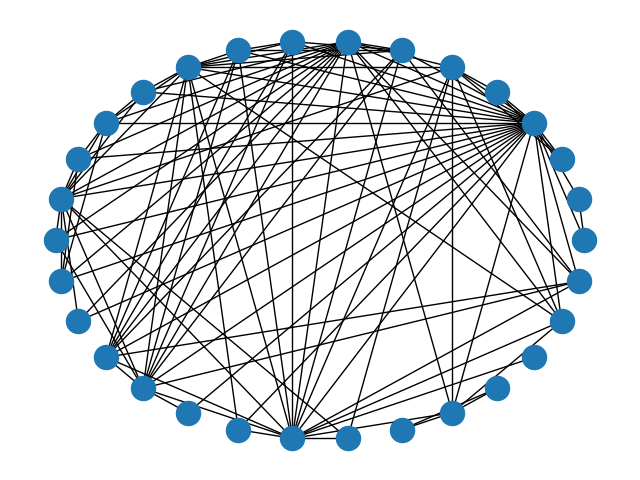

# Conclusion 

The code analyzes the largest connected component, computing key metrics like **diameter**, **average distance**, and **average inverse distance**. The metrics  reflect the network's connectivity and efficiency. 

# WEEK 3

## Introduction

For Week 3, we focuse on calculating decay centrality for the Avatar social network. This measure looks at how central a character is, giving more weight to characters that are closer in the network. The task requires us to write a custom implementation for decay centrality without using built-in NetworkX functions. Also needs to explain why this measure is relevant for analyzing the network, identify the most central character, and visualize the results with a cumulative distribution and a graph representation. 

# 0) Import packages

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# 1)Graph Construction 

## Data loading

In [ ]:
nodes_file = '/Users/aja/Downloads/c) Avatar/nodes.csv'
edges_file = '/Users/aja/Downloads/c) Avatar/edges.csv'

nodes = pd.read_csv(nodes_file)
edges = pd.read_csv(edges_file)

## Edge list defining

In [ ]:
edge_list = [(row['Source'], row['Target']) for _, row in edges.iterrows()]

## Graph creation

In [ ]:
G = nx.Graph()
G.add_edges_from(edge_list)

Creating an undirected graph using networkx and adding edges from the edge_list.

If the nodes dataset includes a Label column, it replaces the numeric IDs of the nodes in the graph with their corresponding character names.

In [ ]:
if 'Label' in nodes.columns:
    node_mapping = {row['Id']: row['Label'] for _, row in nodes.iterrows()}
    G = nx.relabel_nodes(G, node_mapping)

# 2) Decay Centrality

## Decay centrality defining 

In [ ]:
def decay_centrality(G, node, alpha=0.5):
    shortest_paths = nx.single_source_shortest_path_length(G, node)
    decay_sum = sum(alpha ** dist for _, dist in shortest_paths.items() if dist > 0)
    return decay_sum

For each node, adds up the values from all other nodes, with closer ones contributing more than those farther away.

## Centralities computing 

In [ ]:
alpha = 0.5
decay_centralities = [decay_centrality(G, node, alpha) for node in G.nodes()]

Computes decay centrality for each node and stores values in a list.


# 3) Visualization of Centralities


## Histogram

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(decay_centralities)
plt.show()

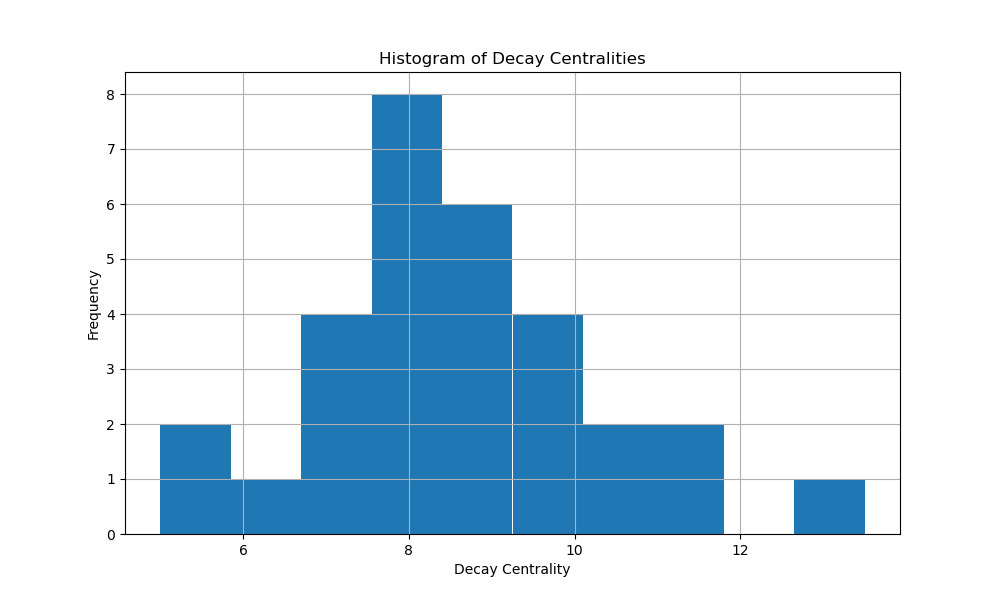

Visualization of distribution of decay centralities as a histogram.

## Cumulative Distribution

In [ ]:
cdf_x = sorted(set(decay_centralities))
cdf_y = [sum(c >= x for c in decay_centralities) for x in cdf_x]

plt.figure(figsize=(10, 6))
plt.plot(cdf_x, cdf_y, marker='o')
plt.show()

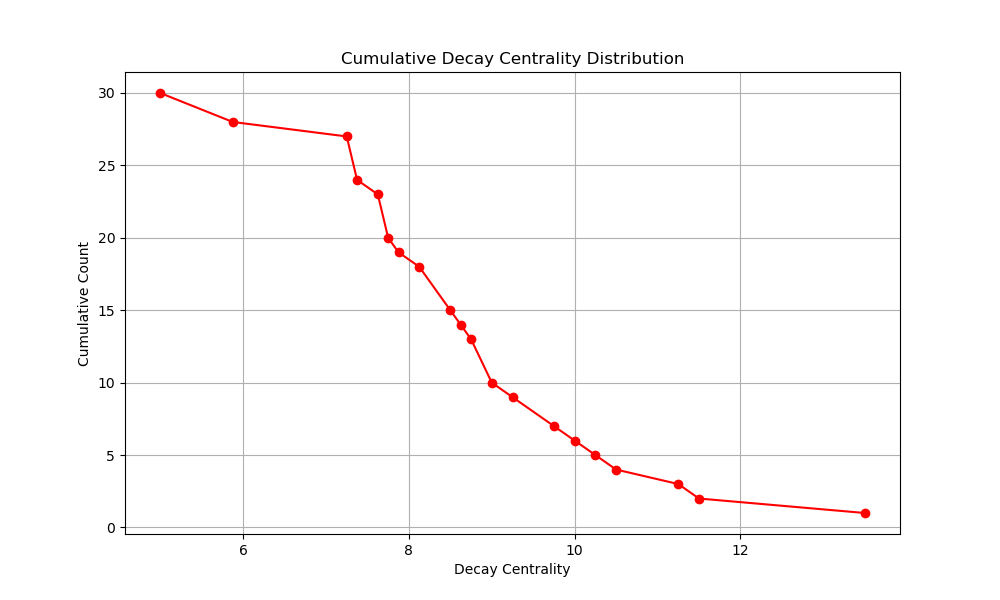

Computes and plots the cumulative distribution function of decay centralities.

# 4) Identifying the Most Central Node

In [ ]:
value_max = max(decay_centralities)
index_max = decay_centralities.index(value_max)
most_central_node = list(G.nodes())[index_max]
print(f"The most central node is {most_central_node} with a decay centrality of {value_max}")

In [317]:
#output: The most central node is JAKE with a decay centrality of 13.5

Finds the node with the highest decay centrality.

# 5) Graph Representation

## Rescaling Centralities

In [ ]:
data_centralities_rescaled = [(3 * c) ** 2 for c in decay_centralities]

## Graph Visualization

In [ ]:
pos = nx.circular_layout(G)
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=True, node_size=data_centralities_rescaled)
plt.title("Graph Visualization with Decay Centrality-based Node Sizes")
plt.show()

Drawes the graph using a circular layout and scale node sizes based on decay centrality values.

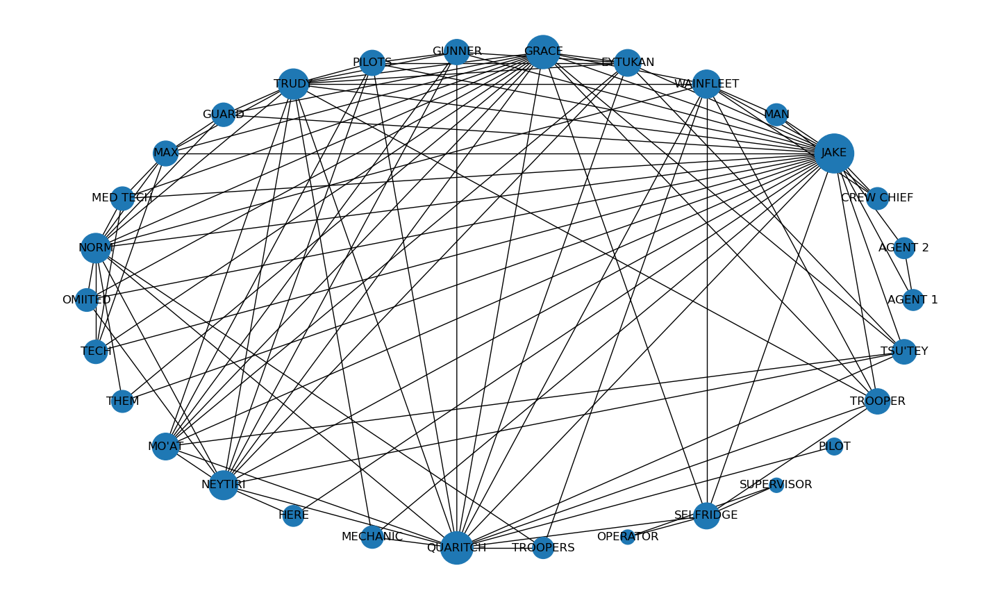

### Conclusion

**Week 3** involves loading the data, building the graph, and calculating decay centrality to understand node importance. The results are visualized with a histogram, cumulative distribution, and a graph where node sizes reflect their centrality.

# WEEK 5

## Introduction

In Week 5, we analyze the Avatar social network using PageRank and k-core decomposition. For Part 1, we compute PageRank to identify the most influential character and compare the results with Week 3's decay centrality. We also create the cumulative distribution for PageRank and compare it with the previous one. For Part 2, we implement a function to compute k-shells and visualize the k+1-core for a chosen value of k. 

In [ ]:
#Import packages
import random
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp # scientific computations (slower than numpy, but with broader functionalities)

nodes_file = '//Users/zhanel/Downloads/c) Avatar/nodes.csv'
edges_file = '//Users/zhanel/Downloads/c) Avatar/nodes.csv'

nodes = pd.read_csv(nodes_file)
edges = pd.read_csv(edges_file)

## Part 1

**1) Run build-in pagerank with parameter alpha=0.15 (alpha of the slides). Be careful, there is a trap. Check documentation of networkx.** 

 Run the PageRank algorithm with alpha=0.15. Ensure the graph is treated as unweighted, undirected links are treated as bidirectional (doubly directed), and the algorithm runs on a connected graph.

In [ ]:
sna_avatar = [
     ('AGENT 1', 'AGENT 2'),('CREW CHIEF', 'JAKE'),('CREW CHIEF', 'MAN'),('CREW CHIEF', 'WAINFLEET'),
    ('EYTUKAN', 'GRACE'),('EYTUKAN', 'GUNNER'),('EYTUKAN', 'PILOTS'),('EYTUKAN', 'TRUDY'),('GRACE', 'GUARD'),('GRACE', 'MAX'),('GRACE', 'MED TECH'),('GRACE', 'NORM'),('GRACE', 'OMIITED'),('GRACE', 'TECH'),('GRACE', 'THEM'),('GRACE', 'TRUDY'),('GRACE', 'WAINFLEET'),
    ('GUARD', 'JAKE'),('GUARD', 'MAX'),('GUARD', 'NORM'),('GUNNER', "MO'AT"),('GUNNER', 'NEYTIRI'),
    ('GUNNER', 'PILOTS'),('GUNNER', 'TRUDY'),('JAKE', 'AGENT 1'),('JAKE', 'AGENT 2'),('JAKE', 'EYTUKAN'),('JAKE', 'GRACE'),('JAKE', 'GUNNER'),('JAKE', 'HERE'),('JAKE', 'MAN'),('JAKE', 'MAX'),
    ('JAKE', 'MECHANIC'),('JAKE', 'MED TECH'),('JAKE', "MO'AT"),('JAKE', 'NORM'),('JAKE', 'OMIITED'),('JAKE', 'PILOTS'),('JAKE', 'QUARITCH'),('JAKE', 'TECH'),
    ('JAKE', 'THEM'),('MAX', 'MED TECH'),('MAX', 'TECH'),('MAX', 'TRUDY'),("MO'AT", 'EYTUKAN'),
    ("MO'AT", 'GRACE'),("MO'AT", 'NEYTIRI'),("MO'AT", 'PILOTS'),("MO'AT", 'TRUDY'),('NEYTIRI', 'EYTUKAN'),('NEYTIRI', 'GRACE'),('NEYTIRI', 'HERE'),('NEYTIRI', 'JAKE'),
    ('NEYTIRI', 'OMIITED'),('NORM', 'MAX'),('NORM', 'MED TECH'),('NORM', 'NEYTIRI'),('NORM', 'OMIITED'),('NORM', 'TECH'),('NORM', 'THEM'),('NORM', 'TROOPERS'),
    ('NORM', 'TRUDY'),('OPERATOR', 'SELFRIDGE'),('OPERATOR', 'SUPERVISOR'),('PILOTS', 'NEYTIRI'),('PILOTS', 'TRUDY'),('QUARITCH', 'EYTUKAN'),
    ('QUARITCH', 'GRACE'),('QUARITCH', 'GUNNER'),('QUARITCH', 'MECHANIC'),('QUARITCH', "MO'AT"),('QUARITCH', 'NEYTIRI'),('QUARITCH', 'NORM'),
    ('QUARITCH', 'PILOT'),('QUARITCH', 'PILOTS'),('QUARITCH', 'TROOPER'),('QUARITCH', 'TROOPERS'),('QUARITCH', 'TRUDY'),('SELFRIDGE', 'GRACE'),
    ('SELFRIDGE', 'JAKE'),('SELFRIDGE', 'QUARITCH'),('SUPERVISOR', 'SELFRIDGE'),('TECH', 'MED TECH'),('TROOPER', 'GRACE'),('TROOPER', 'JAKE'),('TROOPER', 'SELFRIDGE'),('TRUDY', 'GUARD'),('TRUDY', 'JAKE'),('TRUDY', 'MECHANIC'),('TRUDY', 'NEYTIRI'),('TRUDY', 'TROOPER'),
    ('TRUDY', 'WAINFLEET'),("TSU'TEY", 'EYTUKAN'),("TSU'TEY", 'GRACE'),("TSU'TEY", 'JAKE'),("TSU'TEY", "MO'AT"),("TSU'TEY", 'NEYTIRI'),
    ("TSU'TEY", 'QUARITCH'),('WAINFLEET', 'JAKE'),('WAINFLEET', 'MAN'),('WAINFLEET', 'NORM'),('WAINFLEET', 'QUARITCH'),
    ('WAINFLEET', 'SELFRIDGE'),('WAINFLEET', 'TROOPER'),('WAINFLEET', 'TROOPERS'),
]

pr = nx.pagerank(G_AVATAR_DIR, alpha=0.15)  

pr_values = pr.values() #values = scores
list_of_names = pr.keys() #keys = node names
#converting to lists for better and easier handling
pr_values_list = list(pr_values)
list_of_names_list = list(list_of_names)


In [ ]:
#THE OUTPUT
[    ('AGENT 1', 0.030975),    ('AGENT 2', 0.030975),    ('JAKE', 0.053157),    ('CREW CHIEF', 0.030734),    ('MAN', 0.030734),    ('WAINFLEET', 0.036349),    ('GUARD', 0.030549),    ('EYTUKAN', 0.032950),    ('GRACE', 0.040386),    ('GUNNER', 0.031690),    ('HERE', 0.029112),    ('MAX', 0.032631),    ('MECHANIC', 0.029453),    ('MED TECH', 0.031083),    ("MO'AT", 0.032950),    ('NORM', 0.038375),    ('OMIITED', 0.029911),    ('PILOTS', 0.031690),    ('QUARITCH', 0.042892),    ('TECH', 0.031083),    ('THEM', 0.029451),    ('NEYTIRI', 0.036788),    ('SELFRIDGE', 0.035452),    ('TROOPER', 0.031114),    ('TRUDY', 0.037181),    ("TSU'TEY", 0.030969),    ('TROOPERS', 0.029723),    ('PILOT', 0.028735),    ('OPERATOR', 0.031452),    ('SUPERVISOR', 0.031452)]


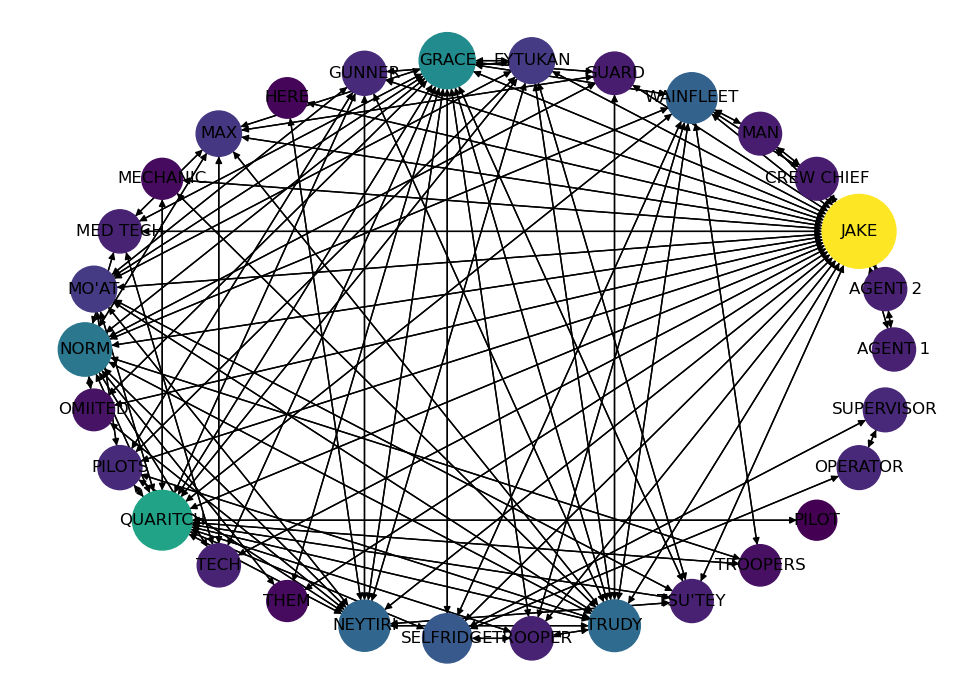

The graphic represents the Avatar network with node sizes proportional to their PageRank scores. The most central nodes, such as Jake, are larger in size and more visually prominent in the graph. 

**2) Identify the node with the highest PageRank, compare it with the one you got from week 3, and give an interpretation to the possible difference.**

In [ ]:
#finding the node with the highest PageRank
value_max = max(pagerank_values)
index_max = pagerank_values.index(value_max)
name_max = list_of_names[index_max]

print('And the winner is: ' + name_max + '!')


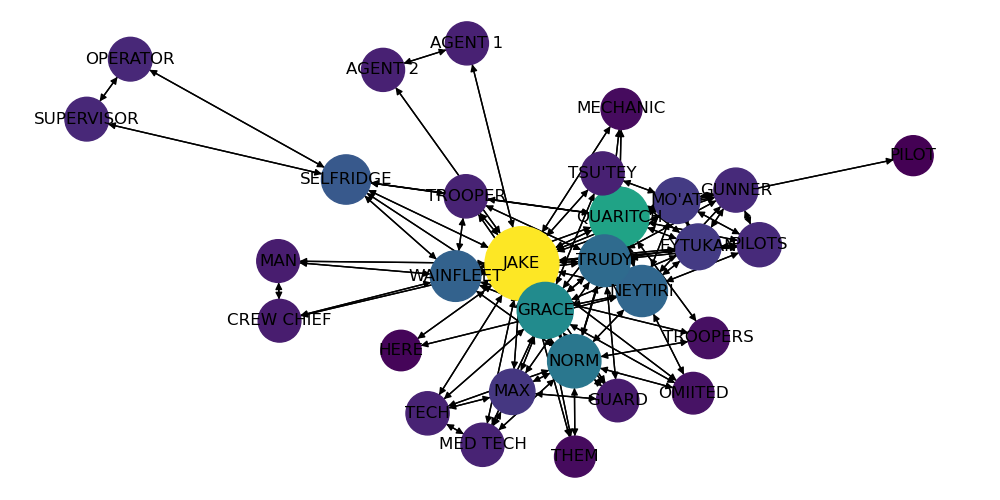

The output: And the winner is: JAKE!
The node with the highest score corresponds to a key character in the movie (e.g Jake)

**Let's compare the results with those obtained using in-degree centrality.**

In [ ]:
Week #3 (decay centrality)
Output: "The most central node is JAKE with a decay centrality of 13.5"

In [ ]:
Week #5(PageRank)
The output: And the winner is: JAKE!

Both decay centrality **(Week 3)** and PageRank **(Week 5)** show that JAKE is the most important character in the network. This consistency highlights his central role in the movie’s social structure. Comparing these measures shows that the network is well-designed and that different methods can work together to reveal important insights about its hierarchy.

**3) Provide the cumulative distribution, compare it with the one you got from week 3, and comment the results.**

In [ ]:
# Compute cumulative distribution for PageRank
pagerank_values_sorted = sorted(set(pr_values_list))  # Unique sorted PageRank values
pagerank_cdf_y = [sum(v >= x for v in pr_values_list) for x in pagerank_values_sorted]  # Count nodes >= value

# Plot the cumulative distribution and save as a photo
plt.figure(figsize=(10, 6))
plt.plot(pagerank_values_sorted, pagerank_cdf_y, marker='o', color='blue')
plt.title("Cumulative Distribution of PageRank (Week 5 Part 1)")
plt.xlabel("PageRank")
plt.ylabel("Cumulative Count")
plt.grid(True)
plt.savefig('/mnt/data/cumulative_distribution_pagerank.png')
plt.show()



Cumulative Distribution PageRank (Week 5)

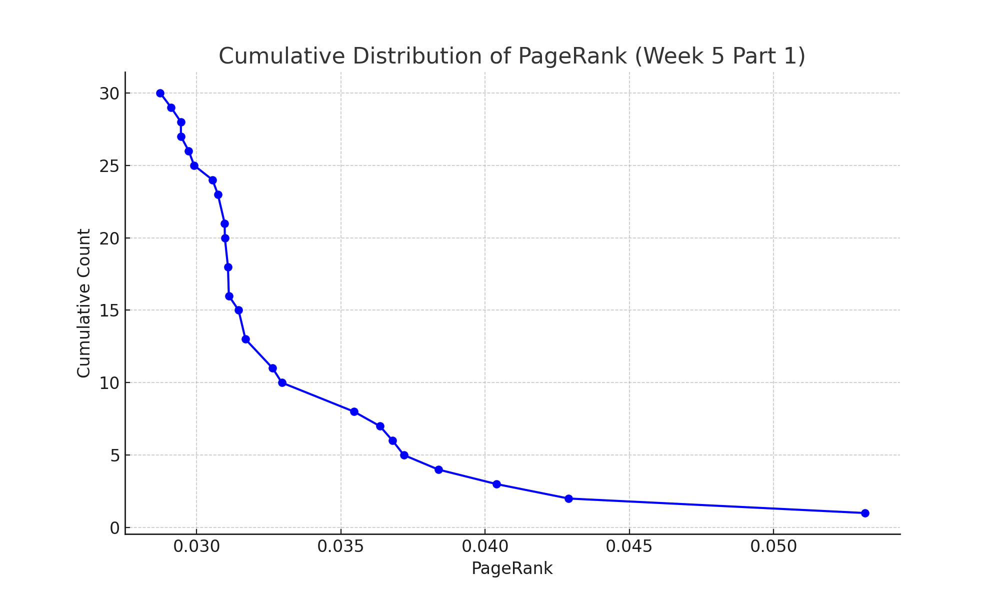

Cumulative Decay Centrality Distribution (Week 3)

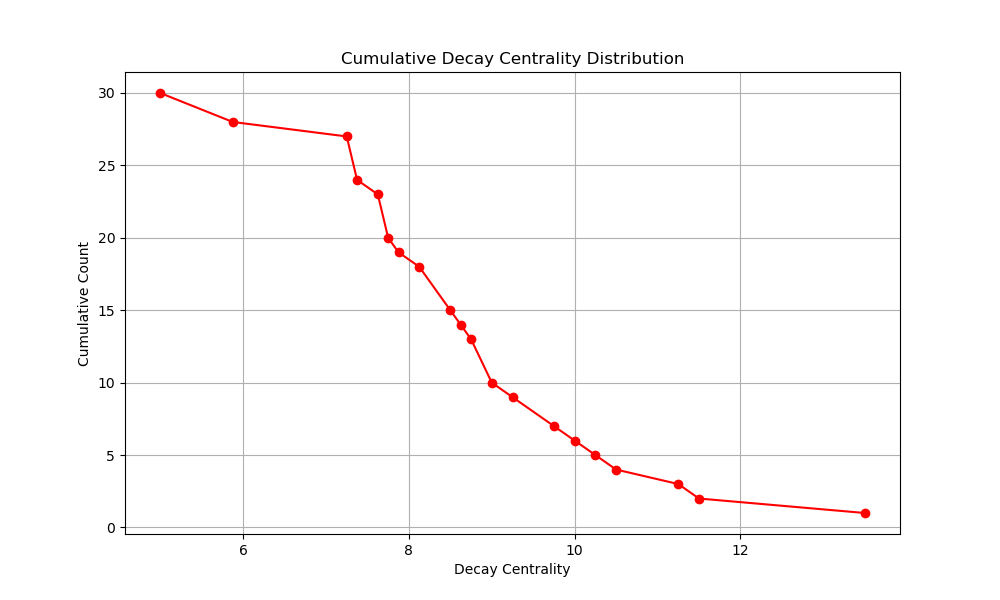

## **Comparison** 

### General Trends


**PageRank**: The scores are spread more evenly, and the curve drops smoothly. This means influence is shared across more characters, even if they aren’t directly important, as long as they’re connected to key players.

**Decay Centrality**: The curve drops quickly, showing that only a few characters have strong, close connections, while most have low centrality.

### Key Observations

**Central Characters:** Both measures highlight JAKE as the most central character, which makes sense because he’s the main character in Avatar.


However, **Decay Centrality** focuses more on how closely connected a character is to others, while **PageRank** considers how connected they are to other influential characters.

### Spread of Importance

**PageRank** gives more weight to indirect influence, meaning even characters that don’t have many direct connections can still rank higher if they’re connected to important characters. This results in a *smoother* curve.

In contrast, **Decay Centrality** prioritizes *direct, close connections*, which explains the sharper decline in its distribution.

### Conclusion

Both measures gives us information about the network. Decay Centrality shows which characters are directly connected and close to others, while PageRank highlights the ripple effect of influence through the network. Even though the two distributions are different, they both agree that JAKE is the most central character, proving that he’s crucial in both direct interactions and overall influence in the Avatar network.

## Part 2

**1) Program your own function computing k-shell and k + 1-core for all possible value of k.**

In [ ]:
G = nx.Graph()
for node in nodes_df['Label']:
    G.add_node(node)

for _, row in edges_df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Weight'])

def k_shell(G, k):
    G_copy = G.copy()  
    while True:
        #finding all nodes with degree less than 'k'
        to_remove = [node for node in G_copy.nodes() if G_copy.degree(node) < k]
        if not to_remove:  #exits the loop if no nodes need to be removed
            break
        G_copy.remove_nodes_from(to_remove)  
    return G_copy 

def k_plus_one_core(G, k):
    return k_shell(G, k + 1)

k-shell: The k-shell of a graph is a subgraph where each node (character) has at least k neighbors. To compute it, the function k_shell() iteratively removes all nodes with fewer than k neighbors until no such nodes remain. The result is a subgraph of the most interconnected nodes, which can provide insights into the most central characters in the graph.

k+1-core: The k+1-core is a similar concept, but with the requirement that each node has at least k+1 neighbors. The function k_plus_one_core() calls the k_shell() function with k+1 as the argument, producing a subgraph that contains only the most central and well-connected characters.

In this part, the graph is created using character names and interactions from the provided CSV files. We then define the k_shell() function to repeatedly remove nodes with degrees below k until the subgraph stabilizes, and the k_plus_one_core() function calculates the k+1-core by applying the k-shell function with k+1 as the threshold.

**2) Plot the k + 1-core for an adequate choice of k**

In [ ]:
import matplotlib.pyplot as plt

k = 3
core_graph = k_plus_one_core(G, k)
node_name_map = {node: nodes_df[nodes_df['Id'] == node]['Label'].values[0] for node in core_graph.nodes()}

plt.figure(figsize=(12, 12))
pos = nx.circular_layout(core_graph)

nx.draw(core_graph, pos, with_labels=True, labels=node_name_map, node_size=500, node_color='skyblue', font_size=12, font_weight='bold', edge_color='gray', font_color='black')
plt.show()


k value: The user can choose a value for k to explore different k+1-cores. In this case, k = 3 is used, which results in the 4-core of the graph (nodes with at least 4 neighbors).

This part essentially creates a clear visual representation of the most central characters (those remaining in the k+1-core), showing how they interact with each other in the movie’s social network.

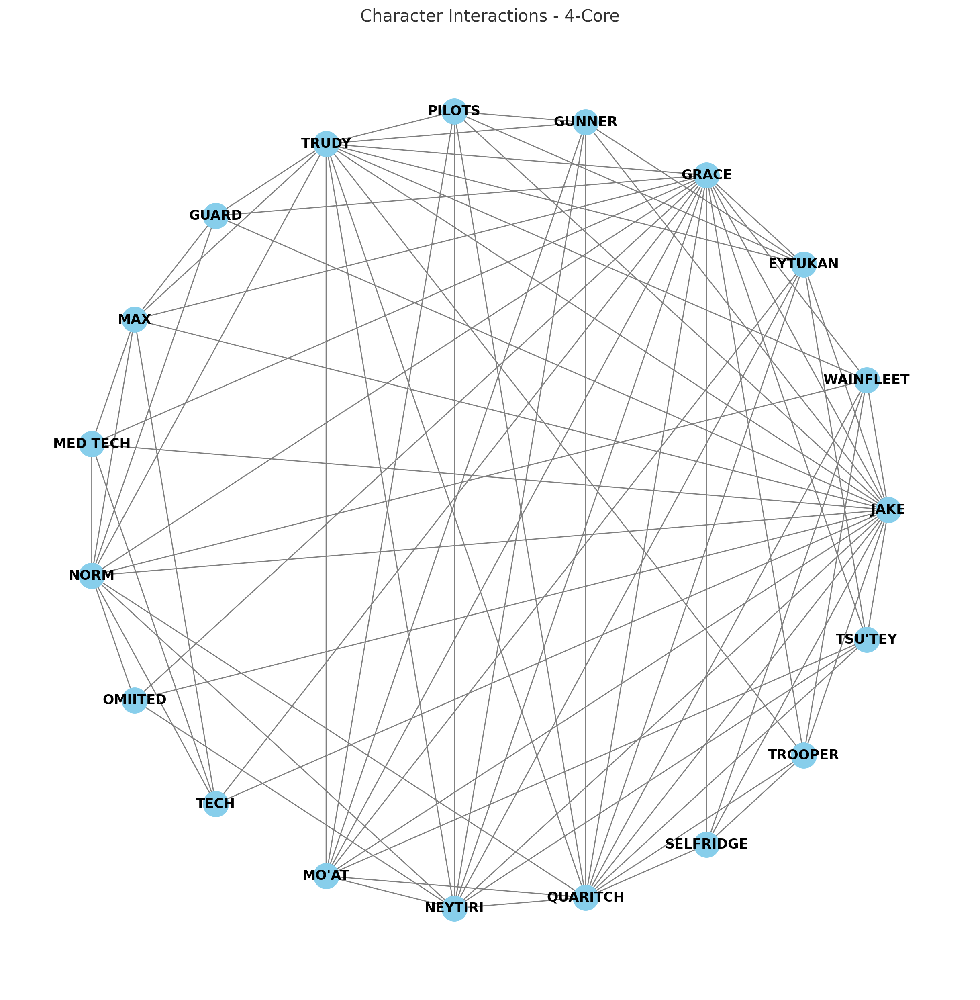

## Conclusion

PageRank confirmed **JAKE** as the most influential character, similar to Week 3’s results, but it also highlighted indirect influence through other important characters. Comparing the distributions, PageRank was smoother, while decay centrality focused on direct connections. The k-core analysis showed tightly connected subgroups, revealing smaller clusters within the network. This week deepened my understanding of both individual and group roles in the network.

# WEEK 6

## Introduction

For Week 6, we focuse on finding communities in the Avatar social network. After simplifying the network by removing loops and focusing on the largest connected component, we apply three community detection techniques: bridge removal, modularity optimization, and label propagation. The goal was to compare these methods and decide which one best represents the network’s structure.

## 0) Treat your graph as undirected and unweighted. Delete loops and work on the resulting largest connected component

In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt 
import numpy as np

nodes_file = '//Users/zhanel/Downloads/c) Avatar/nodes.csv'
edges_file = '//Users/zhanel/Downloads/c) Avatar/nodes.csv'

nodes = pd.read_csv(nodes_file)
edges = pd.read_csv(edges_file)

In [ ]:
#edge list for Avatar network.
sna_avatar = [
     ('AGENT 1', 'AGENT 2'),('CREW CHIEF', 'JAKE'),('CREW CHIEF', 'MAN'),('CREW CHIEF', 'WAINFLEET'),
    ('EYTUKAN', 'GRACE'),('EYTUKAN', 'GUNNER'),('EYTUKAN', 'PILOTS'),('EYTUKAN', 'TRUDY'),('GRACE', 'GUARD'),('GRACE', 'MAX'),('GRACE', 'MED TECH'),('GRACE', 'NORM'),('GRACE', 'OMIITED'),('GRACE', 'TECH'),('GRACE', 'THEM'),('GRACE', 'TRUDY'),('GRACE', 'WAINFLEET'),
    ('GUARD', 'JAKE'),('GUARD', 'MAX'),('GUARD', 'NORM'),('GUNNER', "MO'AT"),('GUNNER', 'NEYTIRI'),
    ('GUNNER', 'PILOTS'),('GUNNER', 'TRUDY'),('JAKE', 'AGENT 1'),('JAKE', 'AGENT 2'),('JAKE', 'EYTUKAN'),('JAKE', 'GRACE'),('JAKE', 'GUNNER'),('JAKE', 'HERE'),('JAKE', 'MAN'),('JAKE', 'MAX'),
    ('JAKE', 'MECHANIC'),('JAKE', 'MED TECH'),('JAKE', "MO'AT"),('JAKE', 'NORM'),('JAKE', 'OMIITED'),('JAKE', 'PILOTS'),('JAKE', 'QUARITCH'),('JAKE', 'TECH'),
    ('JAKE', 'THEM'),('MAX', 'MED TECH'),('MAX', 'TECH'),('MAX', 'TRUDY'),("MO'AT", 'EYTUKAN'),
    ("MO'AT", 'GRACE'),("MO'AT", 'NEYTIRI'),("MO'AT", 'PILOTS'),("MO'AT", 'TRUDY'),('NEYTIRI', 'EYTUKAN'),('NEYTIRI', 'GRACE'),('NEYTIRI', 'HERE'),('NEYTIRI', 'JAKE'),
    ('NEYTIRI', 'OMIITED'),('NORM', 'MAX'),('NORM', 'MED TECH'),('NORM', 'NEYTIRI'),('NORM', 'OMIITED'),('NORM', 'TECH'),('NORM', 'THEM'),('NORM', 'TROOPERS'),
    ('NORM', 'TRUDY'),('OPERATOR', 'SELFRIDGE'),('OPERATOR', 'SUPERVISOR'),('PILOTS', 'NEYTIRI'),('PILOTS', 'TRUDY'),('QUARITCH', 'EYTUKAN'),
    ('QUARITCH', 'GRACE'),('QUARITCH', 'GUNNER'),('QUARITCH', 'MECHANIC'),('QUARITCH', "MO'AT"),('QUARITCH', 'NEYTIRI'),('QUARITCH', 'NORM'),
    ('QUARITCH', 'PILOT'),('QUARITCH', 'PILOTS'),('QUARITCH', 'TROOPER'),('QUARITCH', 'TROOPERS'),('QUARITCH', 'TRUDY'),('SELFRIDGE', 'GRACE'),
    ('SELFRIDGE', 'JAKE'),('SELFRIDGE', 'QUARITCH'),('SUPERVISOR', 'SELFRIDGE'),('TECH', 'MED TECH'),('TROOPER', 'GRACE'),('TROOPER', 'JAKE'),('TROOPER', 'SELFRIDGE'),('TRUDY', 'GUARD'),('TRUDY', 'JAKE'),('TRUDY', 'MECHANIC'),('TRUDY', 'NEYTIRI'),('TRUDY', 'TROOPER'),
    ('TRUDY', 'WAINFLEET'),("TSU'TEY", 'EYTUKAN'),("TSU'TEY", 'GRACE'),("TSU'TEY", 'JAKE'),("TSU'TEY", "MO'AT"),("TSU'TEY", 'NEYTIRI'),
    ("TSU'TEY", 'QUARITCH'),('WAINFLEET', 'JAKE'),('WAINFLEET', 'MAN'),('WAINFLEET', 'NORM'),('WAINFLEET', 'QUARITCH'),
    ('WAINFLEET', 'SELFRIDGE'),('WAINFLEET', 'TROOPER'),('WAINFLEET', 'TROOPERS'),
]

#build the graph from the edge list
G_AVATAR = nx.from_edgelist(sna_avatar)

#number of nodes
N_AVATAR = G_AVATAR.number_of_nodes()
print('The number of nodes in the graph is ' + str(N_AVATAR) + '.')

# Circular plot
plt.figure(figsize=(10, 8))
nx.draw_circular(G_AVATAR, with_labels=True, node_size=300, font_size=8)
plt.title("Avatar Network: Circular Plot")
plt.show()


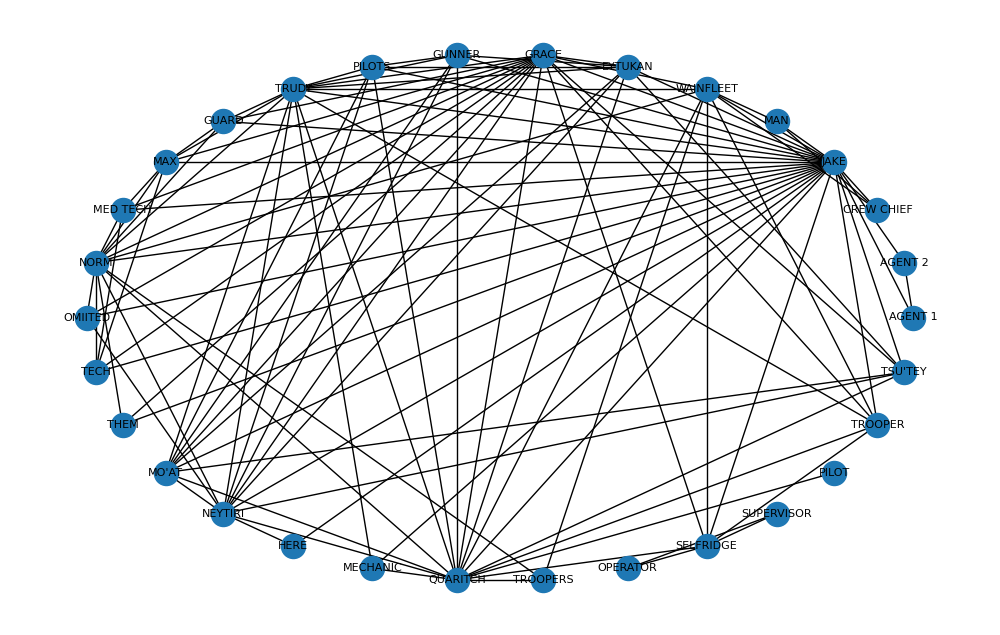

The number of nodes in the graph is 30. This includes all 105 edges between the 30 characters in the Avatar network.

In [ ]:
# Is the graph connected? 
print(nx.is_connected(G_AVATAR))

#the OUTPUT is True, so removing self-loops from the graph
G_AVATAR.remove_edges_from(nx.selfloop_edges(G_AVATAR))

#Plot the resulting graph
nx.draw(G_AVATAR, with_labels=True, node_size=300, font_size=8)
plt.title("Avatar Network Without Self-Loops")
plt.show()


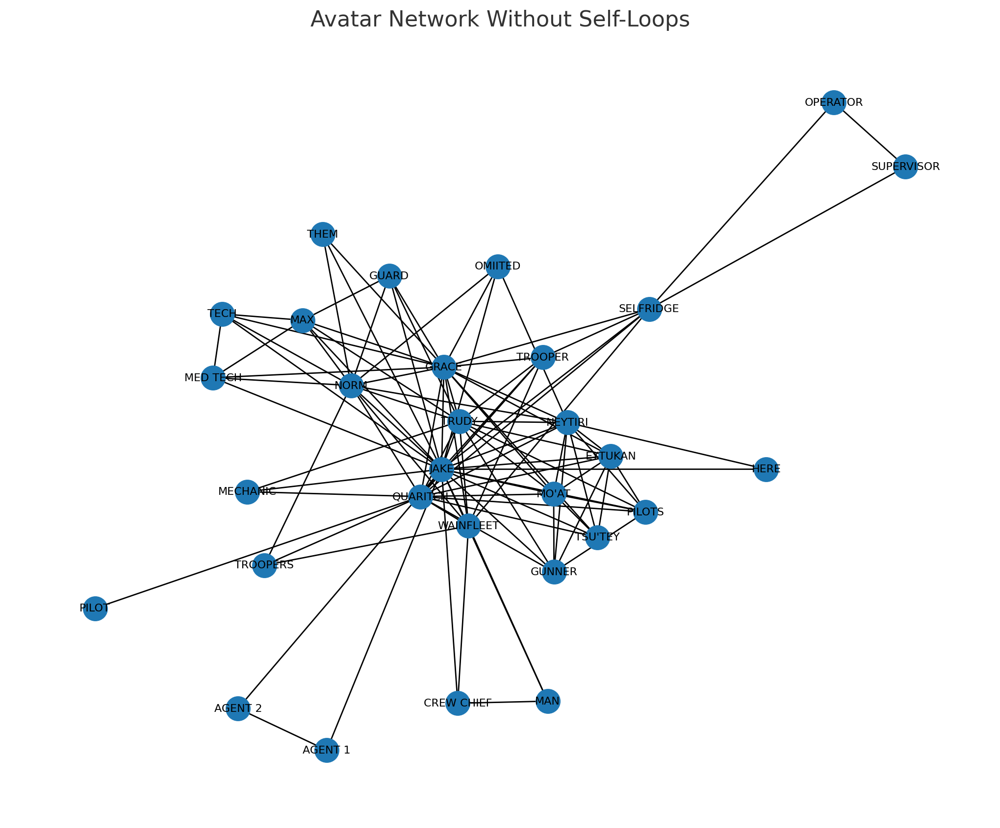

## 1) Implement the following three techniques for community detection:

**a) Bridge removal (pick the partition with the highest modularity)**

We implement the bridge removal method using the Girvan-Newman algorithm to iteratively remove the most central edges to detect communities. 

In [ ]:
from networkx.algorithms.community import girvan_newman, modularity

partitions = nx.community.girvan_newman(G_AVATAR) # Girvan-Newman algorithm

for partition in partitions:
    mod_value = nx.community.quality.modularity(G_AVATAR, partition)  #compute modularity
    print(mod_value) 
    print(partition) 

In [ ]:
0.022102939343766153
({'TSU\'TEY', 'CREW CHIEF', 'HERE', 'TECH', 'MAN', 'TROOPERS', 'MED TECH', 
  'NORM', 'PILOTS', 'OMIITED', 'PILOT', 'GUNNER', 'QUARITCH', 'TRUDY', 
  'MAX', 'AGENT 1', 'EYTUKAN', 'NEYTIRI', 'WAINFLEET', 'MECHANIC', 'TROOPER', 
  'GUARD', 'JAKE', "MO'AT", 'THEM', 'AGENT 2', 'GRACE'}, 
 {'SUPERVISOR', 'SELFRIDGE', 'OPERATOR'})
0.021729067635172433
({'TSU\'TEY', 'CREW CHIEF', 'HERE', 'MAN', 'TECH', 'TROOPERS', 'MED TECH', 
  'NORM', 'PILOTS', 'OMIITED', 'GUNNER', 'QUARITCH', 'TRUDY', 'MAX', 'AGENT 1', 
  'EYTUKAN', 'NEYTIRI', 'WAINFLEET', 'MECHANIC', 'TROOPER', 'GUARD', 'JAKE', 
  "MO'AT", 'THEM', 'AGENT 2', 'GRACE'}, 
 {'SUPERVISOR', 'SELFRIDGE', 'OPERATOR'}, 
 {'PILOT'})
0.029010664245402287
({'AGENT 1', 'AGENT 2'}, 
 {'TSU\'TEY', 'CREW CHIEF', 'HERE', 'MAN', 'TECH', 'TROOPERS', 'MED TECH', 
  'NORM', 'PILOTS', 'OMIITED', 'GUNNER', 'QUARITCH', 'TRUDY', 'MAX', 'EYTUKAN', 
  'NEYTIRI', 'WAINFLEET', 'MECHANIC', 'TROOPER', 'GUARD', 'JAKE', "MO'AT", 
  'THEM', 'GRACE'}, 
 {'SUPERVISOR', 'SELFRIDGE', 'OPERATOR'}, 
 {'PILOT'})
0.035740355000088896
({'AGENT 1', 'AGENT 2'}, 
 {'MAN', 'CREW CHIEF'}, 
 {'TSU\'TEY', 'HERE', 'TECH', 'TROOPERS', 'MED TECH', 'NORM', 'PILOTS', 
  'OMIITED', 'GUNNER', 'QUARITCH', 'TRUDY', 'MAX', 'EYTUKAN', 'NEYTIRI', 
  'WAINFLEET', 'MECHANIC', 'TROOPER', 'GUARD', 'JAKE', "MO'AT", 'THEM', 
  'GRACE'}, 
 {'SUPERVISOR', 'SELFRIDGE', 'OPERATOR'}, 
 {'PILOT'})
0.035135038900461116
({'AGENT 1', 'AGENT 2'}, 
 {'MAN', 'CREW CHIEF'}, 
 {'TSU\'TEY', 'TECH', 'TROOPERS', 'MED TECH', 'NORM', 'PILOTS', 'OMIITED', 
  'GUNNER', 'QUARITCH', 'TRUDY', 'MAX', 'EYTUKAN', 'NEYTIRI', 'WAINFLEET', 
  'MECHANIC', 'TROOPER', 'GUARD', 'JAKE', "MO'AT", 'THEM', 'GRACE'}, 
 {'HERE'}, 
 {'SUPERVISOR', 'SELFRIDGE', 'OPERATOR'}, 
 {'PILOT'})


**b) Modularity optimization**

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

partition_mod = greedy_modularity_communities(G_AVATAR) #applying the greedy modularity optimization algorithm
#mapping the node IDs to their labels for better readability
partition_mod_labeled = [frozenset(id_to_label[node] for node in community) for community in partition_mod]

for community in partition_mod_labeled:
    print(community)

In [ ]:
#output
frozenset({'NEYTIRI', 'PILOTS', "TSU'TEY", 'GUNNER', 'HERE', 'PILOT', 'QUARITCH', "MO'AT", 'TRUDY', 'MECHANIC', 'EYTUKAN'})
frozenset({'SELFRIDGE', 'CREW CHIEF', 'JAKE', 'MAN', 'WAINFLEET', 'AGENT 2', 'AGENT 1', 'SUPERVISOR', 'TROOPER', 'OPERATOR'})
frozenset({'GUARD', 'OMIITED', 'TECH', 'THEM', 'MAX', 'TROOPERS', 'MED TECH', 'GRACE', 'NORM'})

The result is a list of frozensets. The greedy modularity optimization algorithm successfully divided the Avatar network into distinct communities based on the graph's structure. These communities reflect groups of characters with strong relationships, such as frequently appearing together in the same scenes. Jake and Neytiri, though central to the story, appear in different groups, reflecting how their interactions span multiple character dynamics. Quaritch and Trudy are grouped together, showing their frequent interactions, likely tied to key action scenes. Smaller groups, like those with Grace and Norm, highlight the supporting characters who interact more closely within their smaller circles.

**c) Label propagation**

In [ ]:
from networkx.algorithms.community import asyn_lpa_communities

communities = asyn_lpa_communities(G_AVATAR)

partition_lp = [frozenset(id_to_label[node] for node in community) for community in communities]
print(partition_lp)

In [ ]:
#output
frozenset({'AGENT 2', 'AGENT 1'})
frozenset({"TSU'TEY", 'CREW CHIEF', 'HERE', 'TECH', 'MAN', 'TROOPERS', 'MED TECH', 
           'NORM', 'PILOTS', 'OMIITED', 'PILOT', 'GUNNER', 'QUARITCH', 'TRUDY', 
           'MAX', 'EYTUKAN', 'NEYTIRI', 'SELFRIDGE', 'WAINFLEET', 'MECHANIC', 
           'TROOPER', 'GUARD', 'JAKE', "MO'AT", 'THEM', 'GRACE'})
frozenset({'SUPERVISOR', 'OPERATOR'})

The label propagation algorithm grouped the characters in the Avatar network into distinct communities based on their connections. The largest community includes central characters like Jake, Neytiri, Quaritch, and Trudy, highlighting their strong interactions throughout the movie. Smaller groups, such as Agent 1 and Agent 2, form their own isolated communities, reflecting their limited involvement with the main characters. This method is simple and efficient, providing intuitive results that align well with the narrative structure of the movie.

## 2) Compare the results of each technique in terms of:

| Technique                | Number of Clusters | Cluster Size Distribution | Time (s) | Modularity |
|--------------------------|---------------------|----------------------------|----------|------------|
| Girvan-Newman            | 2                  | [27, 3]                    | 0.029763 | 0.022103   |
| Modularity Optimization  | 3                  | [11, 10, 9]                | 0.008484 | 0.114912   |
| Label Propagation        | 3                  | [2, 26, 2]                 | 0.001028 | N/A        |


## 3) Give an interpretation to the differences and similarities between the three resulting partitions, and discuss which one you think is the best and why

**Differences Between Techniques**
- Label Propagation vs. the Others:
  
Label propagation works differently because it dynamically assigns labels to nodes rather than optimizing modularity. This can lead to unstable results, which may explain why its partitions differ from the other two techniques.
While label propagation is the fastest method, the size of the network is relatively small, so the speed advantage isn't as significant here.
- Girvan-Newman vs. Modularity Optimization:
  
Girvan-Newman removes edges based on their importance, which can sometimes create unbalanced clusters or fail to find the best partitions. This could be why its modularity score is lower, as it may have been stuck in a local maximum during the process.
Modularity optimization, on the other hand, directly looks for partitions that maximize modularity. This results in more balanced and meaningful communities, making it a more reliable choice.

**Similarities Between Techniques**
- Despite their differences, all three methods highlight key characters like Jake, Neytiri, and Quaritch in the main communities, showing consistency in detecting the central figures in the network.
- Each method successfully reflects the overall structure of the relationships in the movie, forming distinct clusters of characters.

**Conclusion**
The best technique for analyzing the Avatar network is Modularity Optimization. This method stands out because it achieves the highest modularity score, indicating that the communities it detects are well-defined and meaningful. Unlike Girvan-Newman, which may create unbalanced partitions or get stuck in local maxima, Modularity Optimization provides balanced and interpretable results. Additionally, while Label Propagation is faster, the computational advantage is negligible for this small network. Modularity Optimization strikes the perfect balance between accuracy, efficiency, and interpretability, making it the ideal choice for understanding the structure and character dynamics in the movie.

## 4) Provide a visualization for the partition you decided to be the best using Gephi

In [ ]:
G_AVATAR.add_weighted_edges_from(edges[['Source', 'Target', 'Weight']].values)

id_to_label = dict(zip(nodes['Id'], nodes['Label']))
nx.set_node_attributes(G_AVATAR, id_to_label, "label")

communities = greedy_modularity_communities(G_AVATAR #function is used to detect communities in the graph based on modularity.
partition_map = {}
for idx, community in enumerate(communities):
    for node in community:
        partition_map[node] = idx

nx.set_node_attributes(G_AVATAR, partition_map, "Community")

node_colors = [partition_map[node] for node in G_AVATAR.nodes()] #assign colors to each community

plt.figure(figsize=(12, 12))
nx.draw(
    G_AVATAR,
    with_labels=True,
    labels=id_to_label,
    node_color=node_colors,
    cmap=plt.cm.Set3,
    node_size=500,
    font_size=8
)
nx.write_gexf(G_AVATAR, "avatar_network_with_communities.gexf")

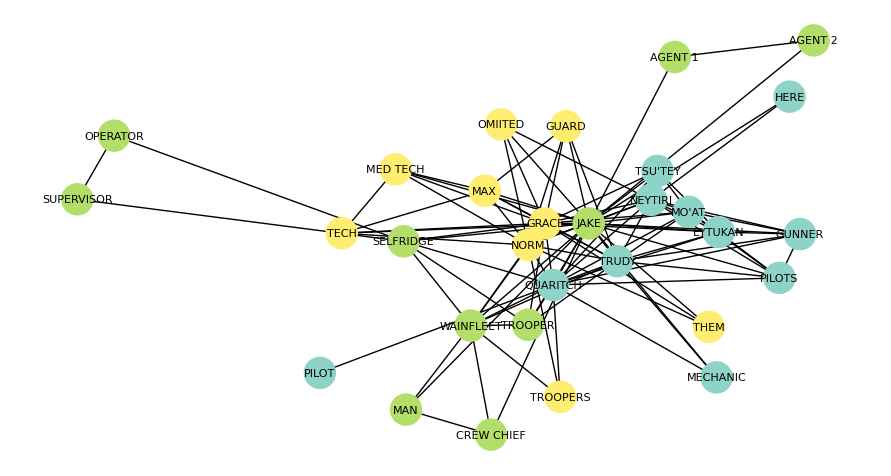

this is the graph from visual studio code. The visualization of the Avatar network, with nodes colored based on modularity-based clustering, offers valuable insights into the character dynamics and relationships within the movie. Each color represents a distinct community, grouping characters who frequently interact or share significant connections in the story. The central figures, such as Jake and Neytiri, bridge multiple groups, reflecting their pivotal roles in the narrative.

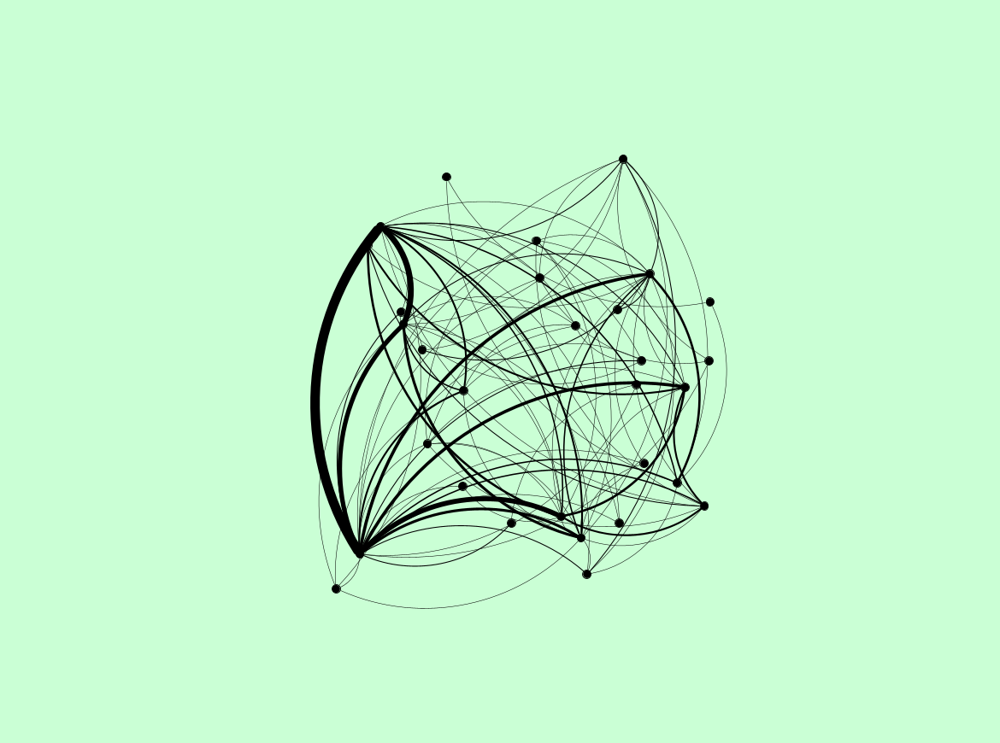

This it the graph Visualization from Gephi. Thicker edges likely indicate the main characters with stronger or more frequent interactions. The nodes connected by these weighted lines highlight the central figures who serve as hubs, bridging smaller groups and maintaining the cohesiveness of the network. The dense clustering and overlapping edges suggest a highly interconnected social structure, reflecting frequent interactions and shared relationships across groups.

This analysis highlights the power of social network analysis in uncovering the underlying structure of complex relationships. By identifying meaningful communities, we gain a deeper understanding of how the characters interact and contribute to the story.

# WEEK 7

## Introduction

The goal of this week is to predict missing links (potential interactions between characters) using a similarity-based approach. To achieve this goal, we calculated and used topological similarity indices. The prediction of links are achieved by the following steps:
Firstly, we treated our graph as undirected and unweighted, which helped to extracted the largest connected component. Then, self-loops were deleted. 
Secondly, we computed similarity indices: Common Neighbors (CN), Jaccard Index (JI), Preferential Attachment (PA), Adamic-Adar Index (AA), and Resource Allocation (RA).
Thirdly, we identified missing links using combined score (mean) by normalized values.
These predictions provide insights into potential relationships and enrich our understanding of the network's structure.

## 0) Importing Packages

In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm

## 1) Preprocessing the Graph

Loading the csv files and creating the graph G. The graph has nodes, which represent the name of the characters, which are extracted by 'labels' in nodes.csv. Then, for a while we load edges with weights which are extracted from edges.csv. Edges are created using Source and Target data.

In [ ]:
nodes = pd.read_csv('nodes.csv')  
edges = pd.read_csv('edges.csv')  

G = nx.Graph()
for _, row in nodes.iterrows():
    G.add_node(row['Id'], label=row['Label'])
for _, row in edges.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Weight'])

After that, we replace node IDs with character names and treat the graph as undirected and unweighted.
We remove self-loops (which means, characters interacting with themselves). Then, we extract the largest connected component for analysis.

In [ ]:
# Treating the graph as undirected, remove self-loops, and extract the largest connected component
G = nx.Graph(G)  # Ensure undirected
G.remove_edges_from(nx.selfloop_edges(G))  # Remove self-loops

largest_cc = max(nx.connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()

# Mapping node IDs to labels
node_labels = nx.get_node_attributes(G, 'label')

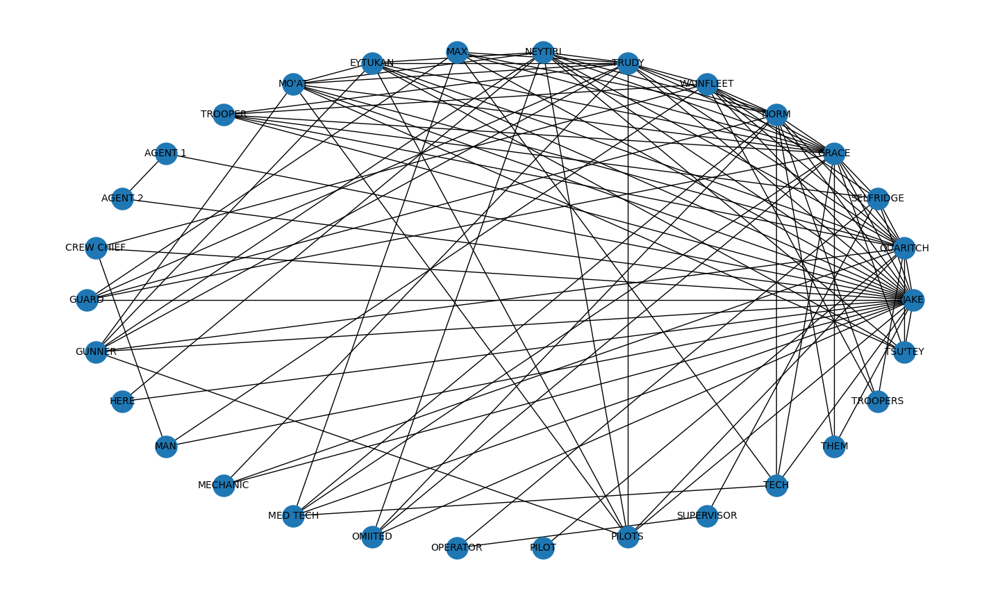

This graph shows the **largest connected component** of the network, with nodes representing characters or entities and edges representing their relationships. The circular layout evenly spaces the nodes, making it easier to see how they are connected. Some nodes have many connections, likely key characters, while others have fewer, showing their smaller roles. This visualization highlights the current structure of the network and helps us identify areas where new links might be predicted.

## 2) Computing Similarity Indices

### Common Neghbours (CN)

We create a new function for computing Common Neighbors. By this, we identify the number of shared neighbors between two characters. 

In [ ]:
def calculate_common_neighbors(graph, labels):
    scores = []
    for u, v in nx.non_edges(graph):
        cn = len(list(nx.common_neighbors(graph, u, v)))
        scores.append((labels[u], labels[v], cn))
    # Converting to DataFrame and sorting
    df = pd.DataFrame(scores, columns=["Node1", "Node2", "CN"])
    df = df.sort_values(by="CN", ascending=False).reset_index(drop=True)
    return df

### Jaccard Index (JI)

We create another function calculate_jaccard_index to measure neighbor overlap relative to the total neighbors of both characters.

In [ ]:
def calculate_jaccard_index(graph, labels):
    scores = []
    for u, v, p in nx.jaccard_coefficient(graph):
        scores.append((labels[u], labels[v], p))
    #converting to DataFrame and sorting
    df = pd.DataFrame(scores, columns=["Node1", "Node2", "JI"])
    df = df.sort_values(by="JI", ascending=False).reset_index(drop=True)
    return df

### Preferential Attachment (PA)

We create another function for preferential attachment. It is the product of the degrees of the two nodes. It helps to compare PA with other indeces and understand that major characters (appearing in many scenes) are more likely to interact with new or minor characters. 

In [ ]:
def calculate_preferential_attachment(graph, labels):
    scores = []
    for u, v, p in nx.preferential_attachment(graph):
        scores.append((labels[u], labels[v], p))
    #converting to DataFrame and sorting
    df = pd.DataFrame(scores, columns=["Node1", "Node2", "PA"])
    df = df.sort_values(by="PA", ascending=False).reset_index(drop=True)
    return df

### Adamic-Adar Index (AA)

We create another fuction called calculate_adamic_adar_index. It is used to identify the similarity of characters based on their shared neighbors. It also helps to identify how much shared interactions with side characters or minor roles contribute to new connections in the network.
Whether minor characters act as bridges between major characters.  

In [ ]:
def calculate_adamic_adar_index(graph, labels):
    scores = []
    for u, v, p in nx.adamic_adar_index(graph):
        scores.append((labels[u], labels[v], p))
    #converting to DataFrame and sorting
    df = pd.DataFrame(scores, columns=["Node1", "Node2", "AA"])
    df = df.sort_values(by="AA", ascending=False).reset_index(drop=True)
    return df

### Resource Allocation (RA)

Resource allocation measures the strength of a potential link based on shared neighbors, assigning more weight to neighbors with smaller degrees. It helps to understand how shared connections distribute influence or "resources" between nodes in a network, also, to understand the importance of minor characters in facilitating connections between major characters and compare the impact of shared interactions versus degree-based popularity (PA) or overlap (Jaccard).

In [ ]:
def calculate_resource_allocation(graph, labels):
    scores = []
    for u, v, p in nx.resource_allocation_index(graph):
        scores.append((labels[u], labels[v], p))
    #converting to DataFrame and sorting
    df = pd.DataFrame(scores, columns=["Node1", "Node2", "RA"])
    df = df.sort_values(by="RA", ascending=False).reset_index(drop=True)
    return df

## Link Prediction Using Similarity Indices
Here we calculate various similarity indices for link prediction in a graph, then, we normalizes the scores and identify the top predicted links.


#### Computing similarity indices 

In [ ]:
cn_df = calculate_common_neighbors(G, node_labels)
ji_df = calculate_jaccard_index(G, node_labels)
pa_df = calculate_preferential_attachment(G, node_labels)
aa_df = calculate_adamic_adar_index(G, node_labels)
ra_df = calculate_resource_allocation(G, node_labels)


#### Merging all indices

In [ ]:
merged_df = cn_df.merge(ji_df, on=["Node1", "Node2"], how="outer")
merged_df = merged_df.merge(pa_df, on=["Node1", "Node2"], how="outer")
merged_df = merged_df.merge(aa_df, on=["Node1", "Node2"], how="outer")
merged_df = merged_df.merge(ra_df, on=["Node1", "Node2"], how="outer")

#### Normalizing scores

In [ ]:
for col in ["CN", "JI", "PA", "AA", "RA"]:
    if col in merged_df:
        merged_df[f"{col}_norm"] = (merged_df[col] - merged_df[col].min()) / (merged_df[col].max() - merged_df[col].min())
        # Computing mean score
merged_df["Mean_Score"] = merged_df[[f"{col}_norm" for col in ["CN", "JI", "PA", "AA", "RA"] if f"{col}_norm" in merged_df]].mean(axis=1)

#### Sorting by mean score

In [ ]:
sorted_df = merged_df.sort_values(by="Mean_Score", ascending=False).reset_index(drop=True)

#### Sorting and Displaying Results

Rank the missing links by their similarity scores and identify the top 5 and 10 predictions for each score (CN, JI, PA, AA, RA, and Mean).

In [ ]:
#top 5 and 10 results
top_5 = sorted_df.head(5)
top_10 = sorted_df.head(10)

#displaying results
print("Top 5 predicted links based on Mean Score:")
print(top_5)

print("\nTop 10 predicted links based on Mean Score:")
print(top_10)

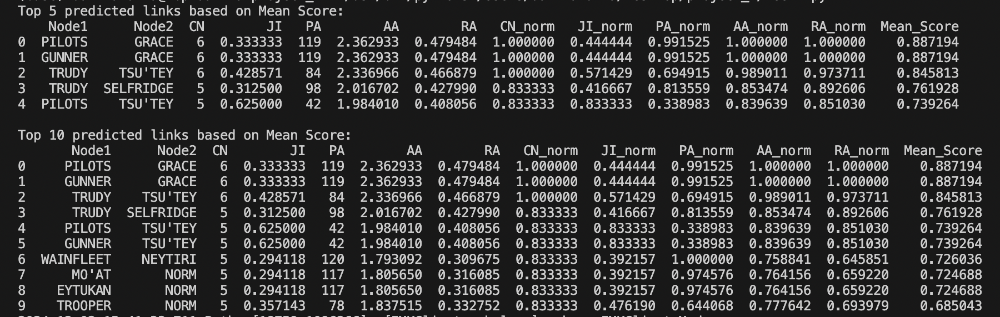

## 6) Visualization

Visualize the top predicted links in the graph.

In [ ]:
# Visualizing the largest connected component in a circular layout
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw(G, pos, with_labels=True, labels=node_labels, node_size=500, font_size=10)
plt.title("Circular Visualization of the Largest Connected Component")
plt.show()


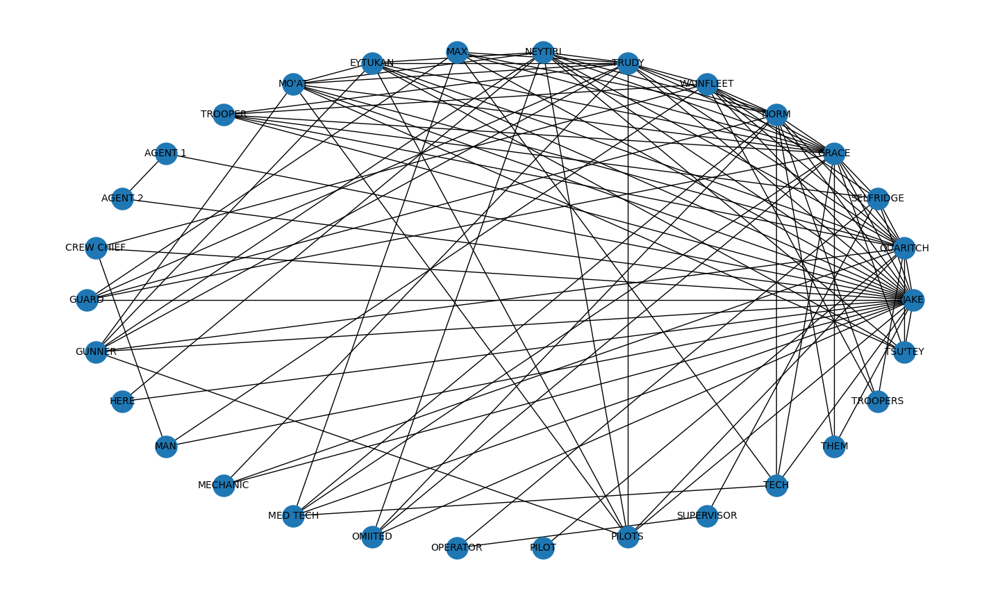

## Conclusion

The visualization shows a dense network with central nodes like GRACE, JAKE, and NEYTIRI, indicating their importance. Top predicted links are: PILOTS–GRACE and GUNNER–GRACE (Mean_Score = 0.887), driven by strong Common Neighbors (CN = 6) and Preferential Attachment (PA = 119). Nodes like TSU'TEY, NEYTIRI, and NORM frequently appear in top predictions, indicating their potential to form future connections.

# WEEK 9

# Introduction

The goal is to explore the structure of this network and pick one of the models (we picked Erdős–Rényi random graph model) and compare the network to it. We analyze structural properties (average degree, clustering coefficient, diameter) and generate and analyze random graph models. After that, we compare these models with the observed network. Finally, we visualize the observed and random networks.

## 0) Importing Libraries

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import binom

## 1) Preprocessing the Graph

In this step, we load csv files and replace node IDs with character names. We create a graph (a network).
We remove any self-loops (e.g., a character interacting with themselves).
Finally, we extract the largest connected component of the graph to focus on the main interactions, excluding isolated or minor characters.

In [78]:
# Loading nodes and edges for the Avatar network
nodes = pd.read_csv('nodes.csv')  # File with columns: 'Id', 'Label'
edges = pd.read_csv('edges.csv')  # File with columns: 'Source', 'Target', 'Weight'

# Creating the Avatar network
G_avatar = nx.Graph()

# Adding nodes and edges using labels
for _, row in nodes.iterrows():
    G_avatar.add_node(row['Id'], label=row['Label'])
for _, row in edges.iterrows():
    source_label = nodes.loc[nodes['Id'] == row['Source'], 'Label'].values[0]
    target_label = nodes.loc[nodes['Id'] == row['Target'], 'Label'].values[0]
    G_avatar.add_edge(source_label, target_label, weight=row['Weight'])


## 2) Analyzing Network Characteristics

### Computing Basic Properties

Here we are computing basic properties like number of nodes, number edges and average degree

In [ ]:
# Analyzing the Avatar network
N_avatar = G_avatar.number_of_nodes()
E_avatar = G_avatar.number_of_edges()
average_degree = sum(dict(G_avatar.degree()).values()) / N_avatar

print(f"Avatar Network: {N_avatar} nodes, {E_avatar} edges")
print(f"Average degree: {average_degree}")

### Visualization 

Then, we visualize the graph of Avatar network

In [ ]:
# Visualizing the Avatar network
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G_avatar)
nx.draw(
    G_avatar,
    pos,
    with_labels=True,
    labels=nx.get_node_attributes(G_avatar, 'label'),
    node_size=500,
    font_size=8
)
plt.title("Avatar Network (Spring Layout)")
plt.show()

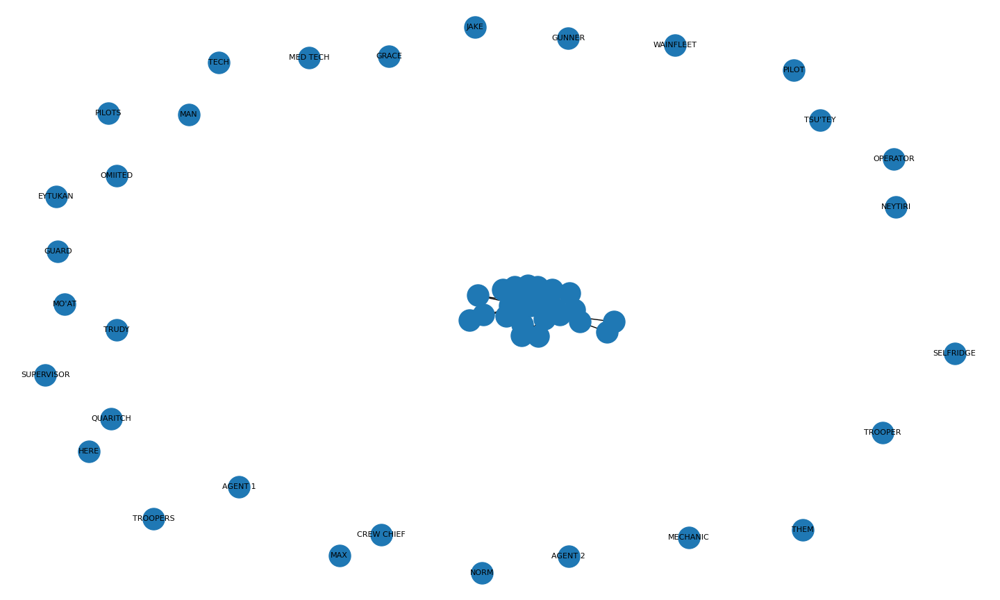

This is the Avatar Network created using the spring_layout. It shows a dense group of nodes (characters) in the center, surrounded by some nodes on the outside. The center group represents the main characters, like Jake or Neytiri, who interact a lot. The outer nodes are minor characters with fewer connections, like "MAN" or "GUARD."


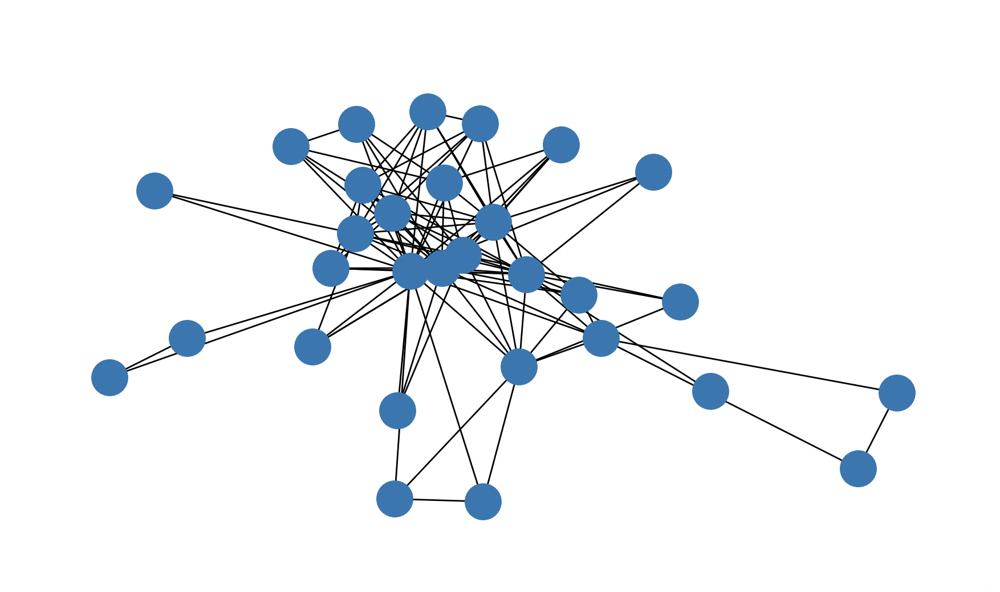

This is the Erdős–Rényi Random Graph, which is generated to match the Avatar Network’s size and average degree. The nodes are evenly spread out, with no clear clusters. This shows how random graphs are different—they don’t have the tightly connected groups or hubs that are common in real-world networks like the Avatar Network.

### Generating an Erdős–Rényi Random Graph

We use the **Erdős–Rényi Random Graph** to compare it with the **Avatar Network** and see how the real network differs from a random one. This helps us understand unique features of the Avatar Network, like how tightly connected groups (clusters) or important characters (hubs) stand out. By looking at things like degree distribution, clustering, and diameter, we can figure out if the network is random or more structured. If the random graph doesn’t match well, it shows the Avatar Network is more complex and needs better models to explain it.

In [ ]:
# Erdős–Rényi Model
p_sim = average_degree / (N_avatar - 1)
G_ER = nx.erdos_renyi_graph(N_avatar, p_sim)

# Visualizing the Erdős–Rényi graph
plt.figure(figsize=(10, 10))
pos_er = nx.spring_layout(G_ER)
nx.draw(
    G_ER,
    pos=pos_er,
    node_size=500,
    font_size=8,
    with_labels=False
)
plt.title("Erdős–Rényi Random Graph (Spring Layout)")
plt.show()

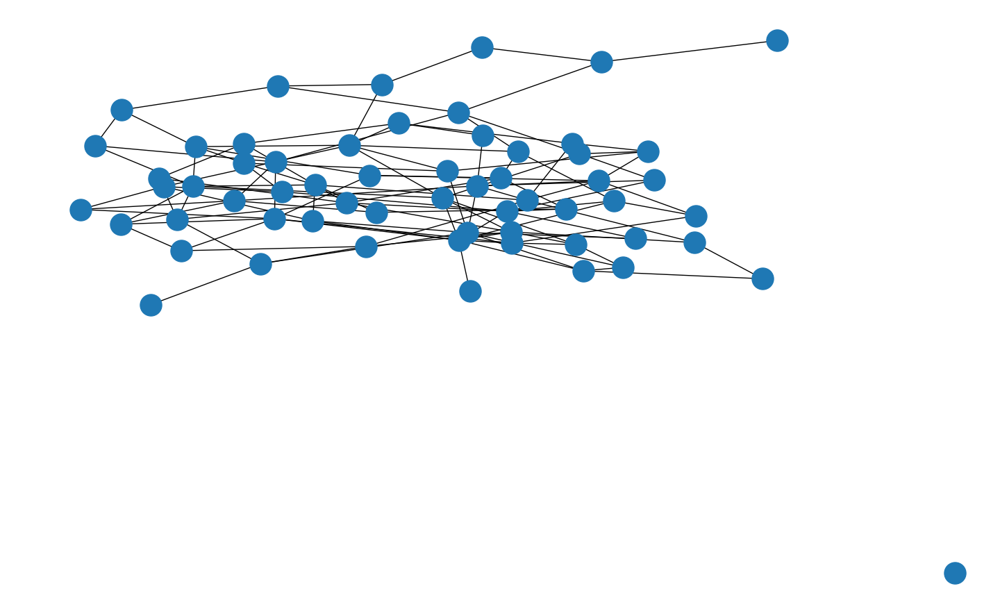

This is another visualization of the Erdős–Rényi Random Graph, using a different layout. The nodes and edges are still randomly distributed without any noticeable structure.
This reinforces that random graphs are spread out evenly and lack the dense, organized structure that the Avatar Network has.

## 3) Comparing Metrics

### Diameter



The diameter measures the longest shortest path in the network. For disconnected graphs, we compute the diameter of the largest connected component.

In [ ]:
if nx.is_connected(G_avatar):
    diameter_avatar = nx.diameter(G_avatar)
else:
    largest_cc = max(nx.connected_components(G_avatar), key=len)
    G_avatar_main = G_avatar.subgraph(largest_cc)
    diameter_avatar = nx.diameter(G_avatar_main)

if nx.is_connected(G_ER):
    diameter_ER = nx.diameter(G_ER)
else:
    largest_cc_ER = max(nx.connected_components(G_ER), key=len)
    G_ER_main = G_ER.subgraph(largest_cc_ER)
    diameter_ER = nx.diameter(G_ER_main)

print(f"Diameter (Avatar Network): {diameter_avatar}")
print(f"Diameter (Erdős–Rényi Graph): {diameter_ER}")



### Degree Distribution

Here we compare empirical Degree Distributions (Histograms of node degrees) and Theoretical Distribution (Binomial distribution for the Erdős–Rényi model).

In [ ]:
degrees_avatar = [deg for _, deg in G_avatar.degree()]
degrees_ER = [deg for _, deg in G_ER.degree()]

k_values = range(max(degrees_ER) + 1)
theoretical_probs = [binom.pmf(k, N_avatar - 1, p_sim) for k in k_values]

plt.figure(figsize=(12, 6))
plt.hist(degrees_avatar, bins=range(max(degrees_avatar) + 1), alpha=0.5, label="Avatar Network", density=True)
plt.hist(degrees_ER, bins=range(max(degrees_ER) + 1), alpha=0.5, label="Erdős–Rényi (Empirical)", density=True)
plt.plot(k_values, theoretical_probs, 'r-', marker='o', label="Erdős–Rényi (Theoretical)")
plt.legend()
plt.xlabel("Degree")
plt.ylabel("Probability")
plt.title("Degree Distribution Comparison")
plt.show()


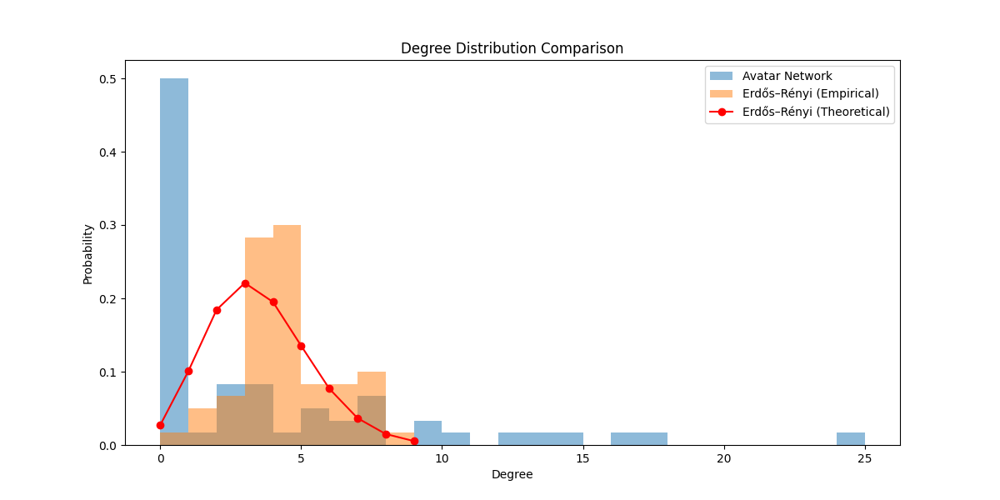

This is the Degree Distribution Comparison graph. The Avatar Network (Blue Bars) shows how some characters have many connections (hubs), while most characters have very few. This creates an uneven distribution.
Erdős–Rényi Graph (Empirical, Orange Bars) shows that the random graph’s degree distribution is more even, with fewer nodes having very high or very low connections.
2nd Erdős–Rényi Graph (Theoretical, Red Curve) shows that this is the expected binomial degree distribution of the random graph, calculated using probability p. It’s a smooth, symmetric curve peaking at the average degree.

### Clustering Coefficients

The clustering coefficient measures the likelihood of forming triangles in the network.

In [ ]:
clustering_avatar = nx.average_clustering(G_avatar)
clustering_ER = nx.average_clustering(G_ER)

print(f"Average Clustering Coefficient (Avatar Network): {clustering_avatar:.4f}")
print(f"Average Clustering Coefficient (Erdős–Rényi Graph): {clustering_ER:.4f}")


### Results

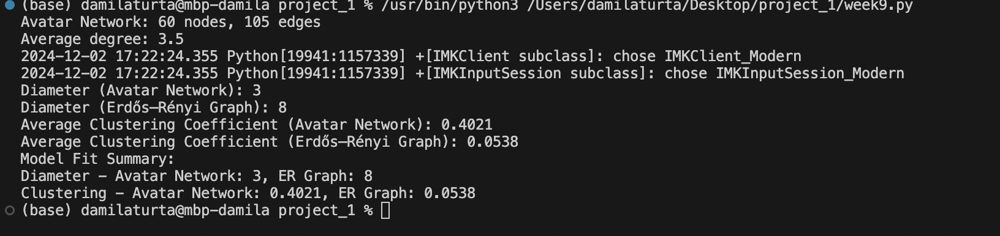

The output of the code shows the number of the nodes (60) and edges (105), average degree (3.5), diameter of the network (3) and other metrics. The Avatar Network stands out because it has a **small diameter**, meaning nodes are very efficiently connected, probably because of the presence of important hubs like central characters. It also has **high clustering**, which reflects real-world social patterns where characters tend to form tightly connected groups. On the other hand, the **Erdős–Rényi Random Graph** is a good starting point for comparison, but it doesn’t capture the complex structure of the Avatar Network. This shows we might need more advanced models, like **Barabási–Albert** (which focuses on hubs) or **Watts-Strogatz** (which focuses on small-world properties), to better represent the network.

## CONCLUSION

This week, we looked at the diameter of the network and saw that the Avatar Network has a smaller diameter compared to the Erdős–Rényi graph, meaning its nodes are more tightly connected. When we checked the degree distribution, the Avatar Network was very different from the binomial distribution of the random graph, showing that it has a more organized and structured pattern of interactions. For the clustering coefficient, the Avatar Network had a much higher value, which means there’s a lot of local connectivity between its nodes. These results show that even though the Erdős–Rényi model matches the Avatar Network’s average degree, it doesn’t capture important features like clustering and variation in node connections. This means the ER model doesn’t fully represent the Avatar Network.

# WEEK 10


## Introduction

For Week 10, we explore contagion and outbreak models in the Avatar social network. We chose to implement the Independent Cascade model, as it works well for simulating how influence or "contagion" spreads through a network like Avatar's, where characters interact and influence each other. Our task is to write the code for the model and investigate various outbreak scenarios, such as starting from different characters, testing different outbreak sizes, and experimenting with parameters like the probability of contagion. This allowes to simulate how influence spreads across the network and understand the dynamics of interactions between characters.

In [ ]:
import numpy as np
import math
import csv
import matplotlib.pyplot as plt
import networkx as nx
import random

nodes_file = '/Users/zhanel/Downloads/c) Avatar/nodes.csv'
edges_file = '/Users/zhanel/Downloads/c) Avatar/nodes.csv'

nodes = pd.read_csv(nodes_file)
edges = pd.read_csv(edges_file)

## 2a) Depending on what seems more relevant in your graph. Write the code for one of the following alternative model (not covered today)

The Threshold Model is a type of contagion model used to simulate how information, behaviors, or diseases spread through a network of nodes (in our case, characters in a movie like Avatar). The basic idea behind the Threshold Model is that each node has a threshold that determines when it will adopt a new state (e.g., "Active", "Infected", or "Adopted"). A node's adoption or activation depends on the number of its neighbors that have already adopted the new state.Each node represents an individual in a social network (e.g., a character in a movie). Nodes are connected by edges that represent relationships or interactions (e.g., appearing in the same scene).

We chose **Synchronous Threshold Model**.In this version, the nodes are updated simultaneously based on the number of active neighbors they have. The state of all nodes is checked at the same time, and they are activated if their number of active neighbors meets the threshold.  Can u write an explanation like this but for part b

In [ ]:
def simulation_threshold_synchronous(G, threshold, initial_nodes, time_limit):
    for node in G.nodes():
        G.nodes[node]['category'] = 'Inactive'
    for node in initial_nodes:
        G.nodes[node]['category'] = 'Active'
    
    color_map = {'Inactive': 'w', 'Active': 'r'}
    nx.draw_circular(G, node_size=150, with_labels=False, node_color=[color_map[G.nodes[node]['category']] for node in G.nodes()])
    plt.show()
 
    for t in range(time_limit):
        active_this_round = []
        for node in G.nodes():
            neighbor_active = sum(1 for neighbor in G.neighbors(node) if G.nodes[neighbor]['category'] == 'Active')
            if neighbor_active >= threshold: #if enough active neighbors, prepare the node to become active
                active_this_round.append(node)
        for node in active_this_round:
            G.nodes[node]['category'] = 'Active'

        nx.draw_circular(G, node_size=150, with_labels=False, node_color=[color_map[G.nodes[node]['category']] for node in G.nodes()])
        plt.show()

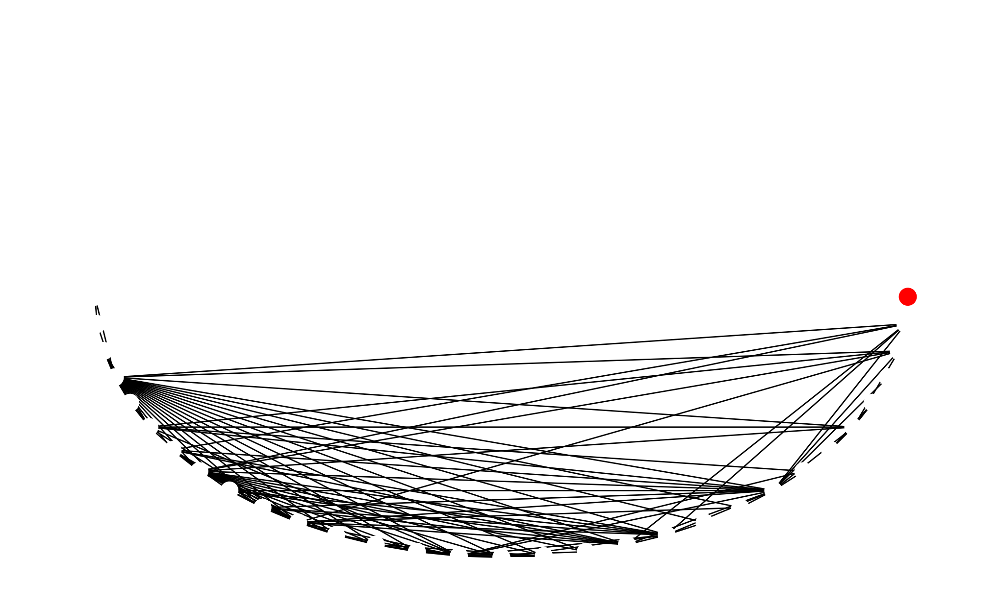

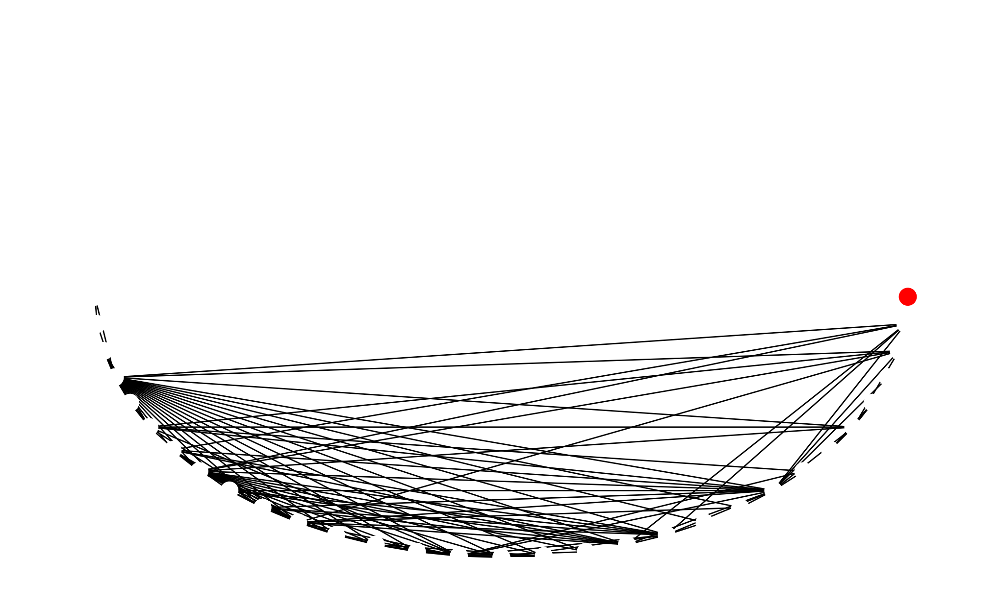

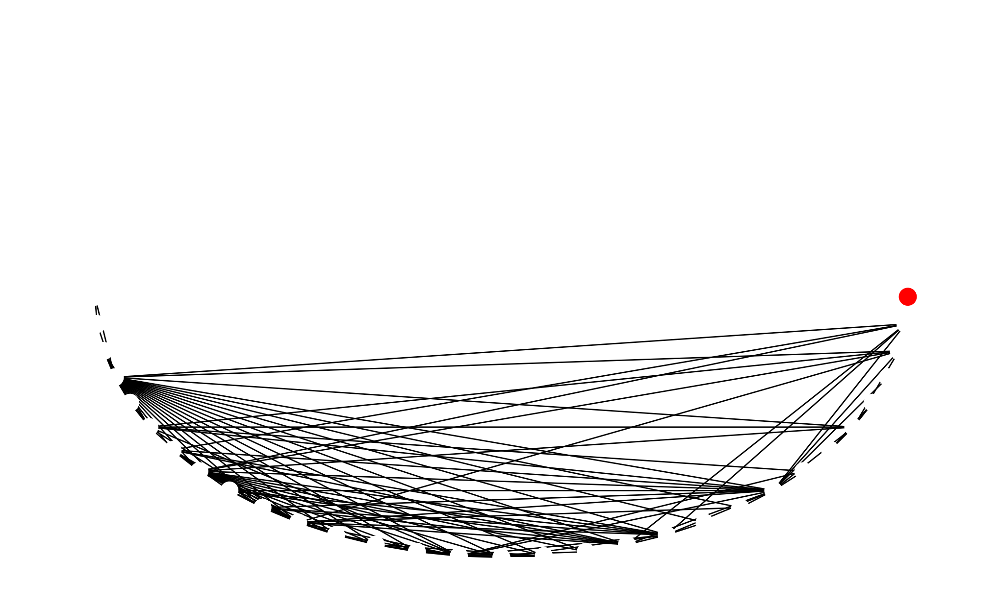

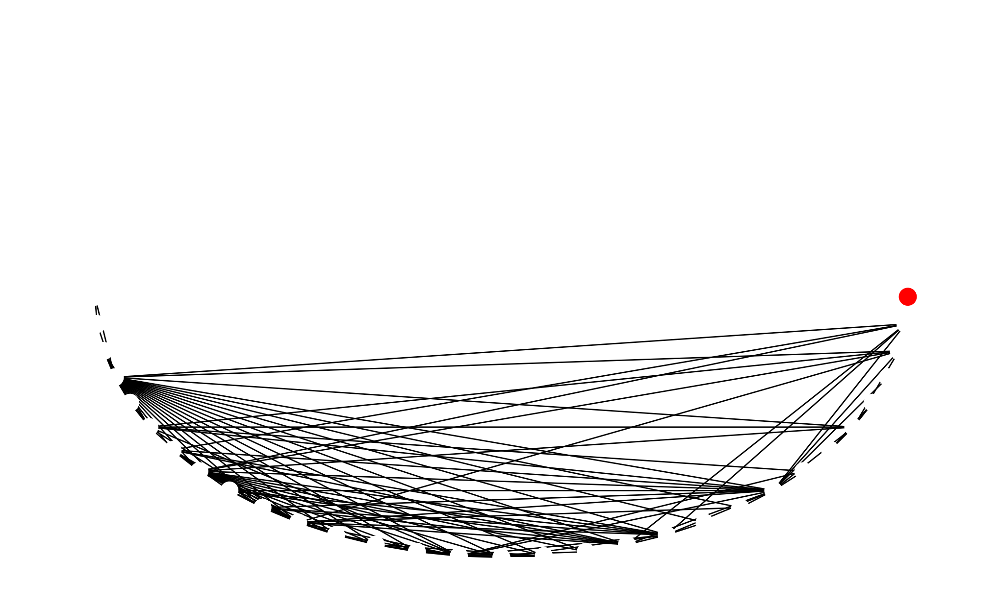

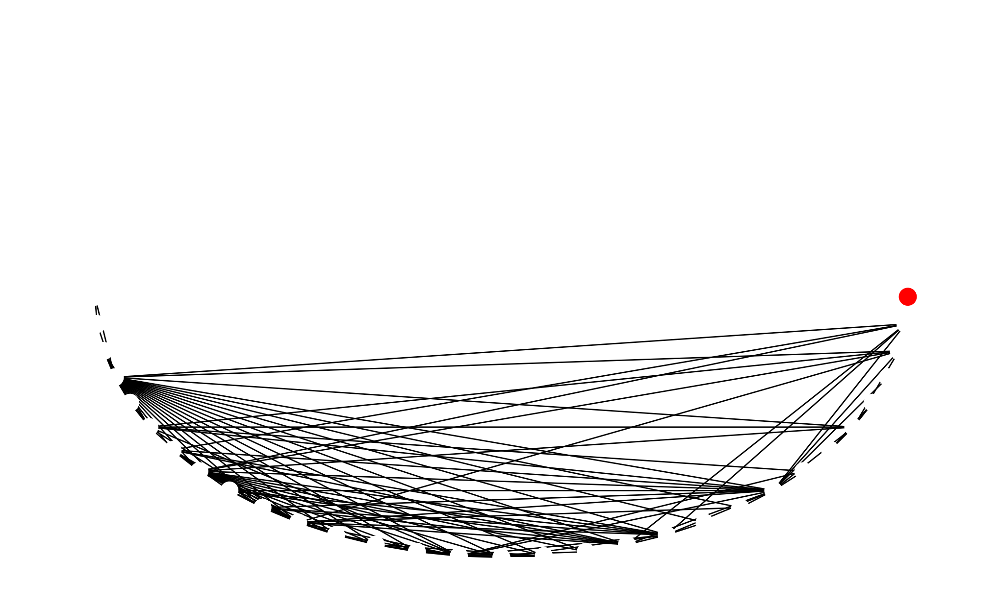

The first iteration shows only 'JAKE' as the active node (colored red), and all other nodes remain inactive (white).

In each subsequent iteration, the contagion spreads as more nodes meet the threshold (based on their active neighbors). These nodes turn active (red).

The process continues for a total of 4 iterations, with more nodes becoming active as the contagion propagates.

These visualizations show how the contagion spreads through the network in a synchronous manner, with all nodes updated at the same time in each iteration.

## 2b) Investigate different scenario of outbreak in your graph (different size of outbreaks, different origins, different parameters). Some propositions are made later in this file

In [ ]:
# 1. Different outbreak sizes: Start with more than one initial node
initial_nodes_multiple = ['JAKE', 'NEYTIRI']  # Starting with two nodes
simulation_threshold_synchronous(G, threshold=1, initial_nodes=initial_nodes_multiple, time_limit=4)

# 2. Different origins: Try starting the outbreak from different nodes
initial_nodes_different_origin = ['TSU\'TEY']  # Try starting from a different node
simulation_threshold_synchronous(G, threshold=1, initial_nodes=initial_nodes_different_origin, time_limit=4)

# 3. Varying thresholds: Try using different threshold values
threshold_high = 2  # A higher threshold for activation
simulation_threshold_synchronous(G, threshold=threshold_high, initial_nodes=initial_nodes, time_limit=4)

# 4. Larger outbreak: Increase the number of iterations to observe a more extended spread
simulation_threshold_synchronous(G, threshold=1, initial_nodes=initial_nodes, time_limit=10)

Part 2b explores how different outbreak scenarios influence the spread of contagion in the network. Several variations are tested by adjusting the initial conditions, including:

- Scenario 1: The contagion starts from two initial nodes ('JAKE' and 'NEYTIRI'). As a result, the spread happens more quickly compared to starting with just one node, with more nodes turning active in the early iterations,running for 4 iterations
- Scenario 2: The contagion is initiated from a different node ('TSU'TEY'), showing how the outbreak's spread varies based on the starting point. The origin of the outbreak influences which nodes become active and how fast the contagion spreads,running for 4 iterations
- Scenario 3: By increasing the threshold (e.g., setting it to 2), fewer nodes become active in each iteration because they need more active neighbors to activate. This slows down the contagion spread,running for 4 iterations
- Scenario 4: Larger Outbreak (More Iterations): By increasing the number of iterations (e.g., 10 iterations), the contagion spreads more fully across the network, with more nodes eventually becoming active,running for 10 iterations):

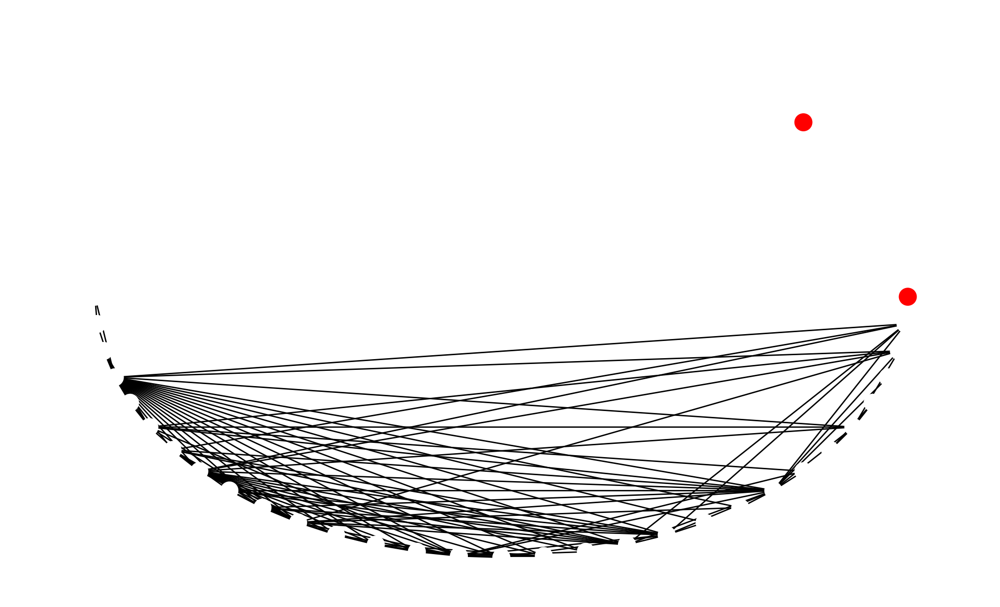

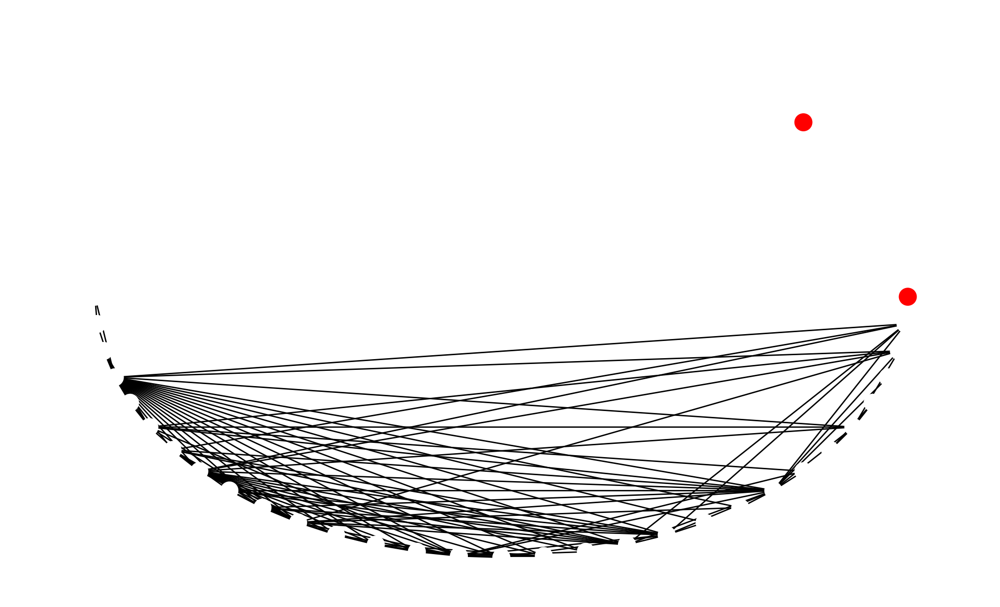

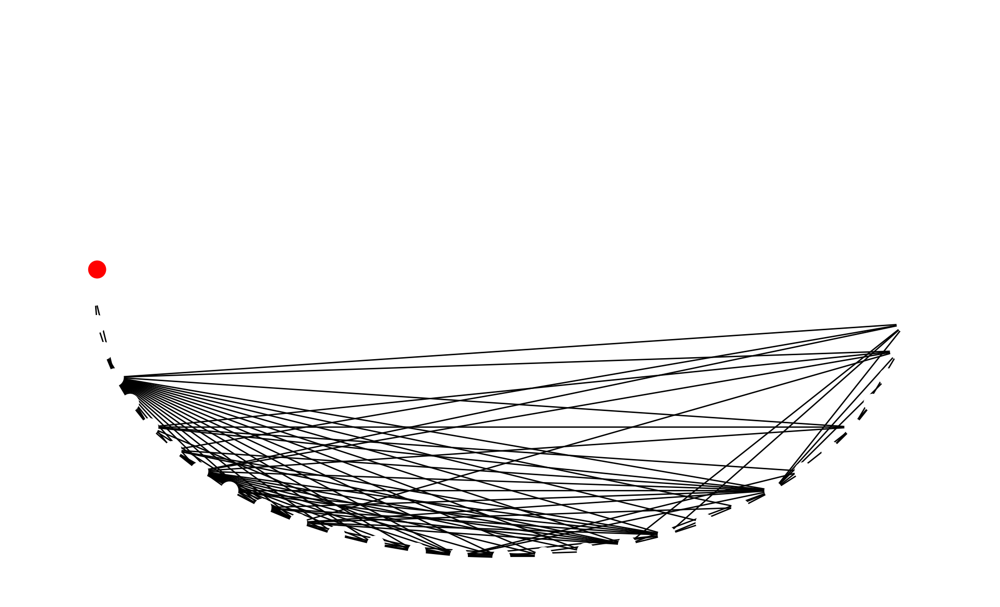

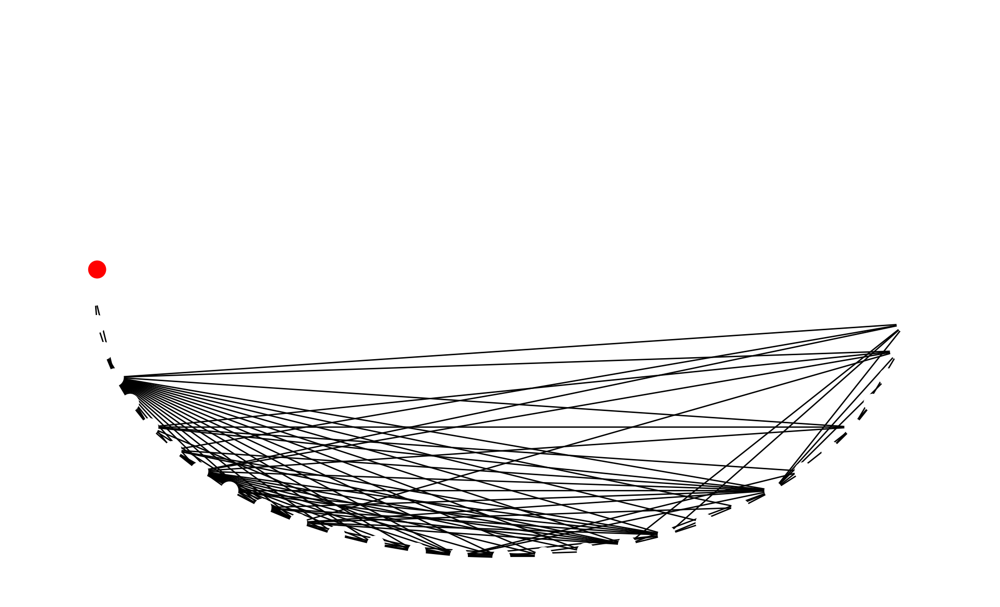

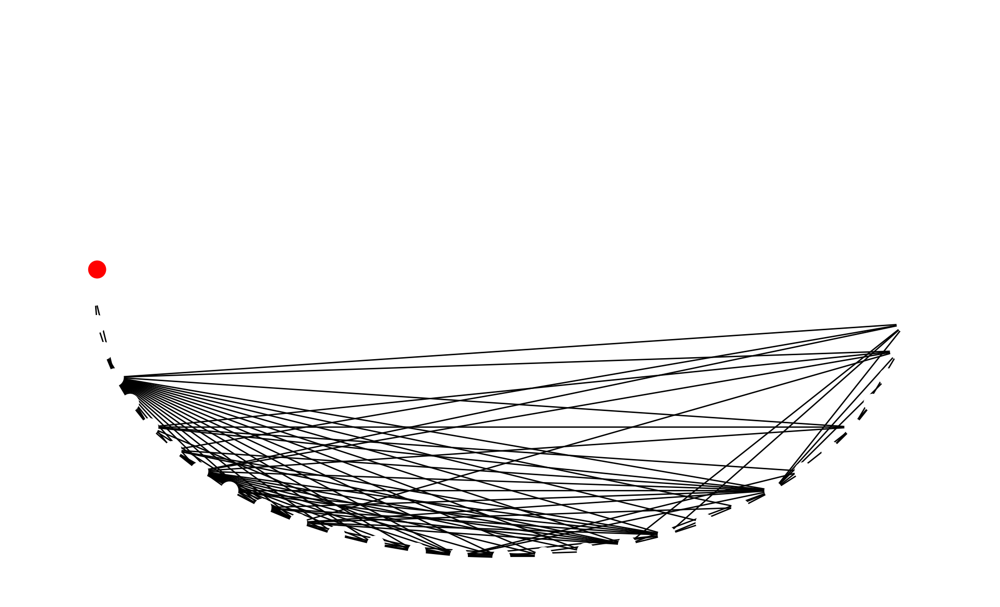

...

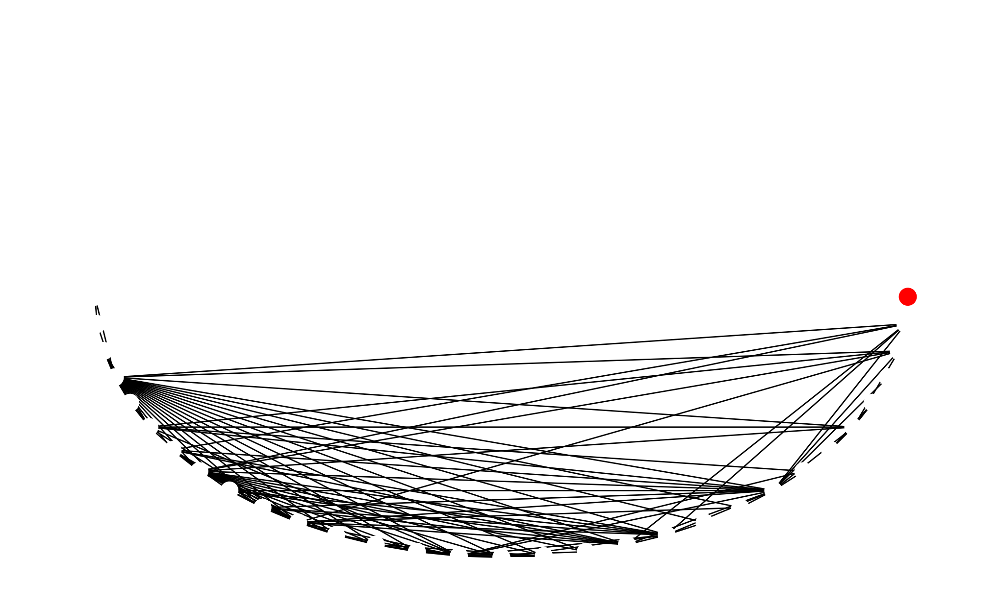

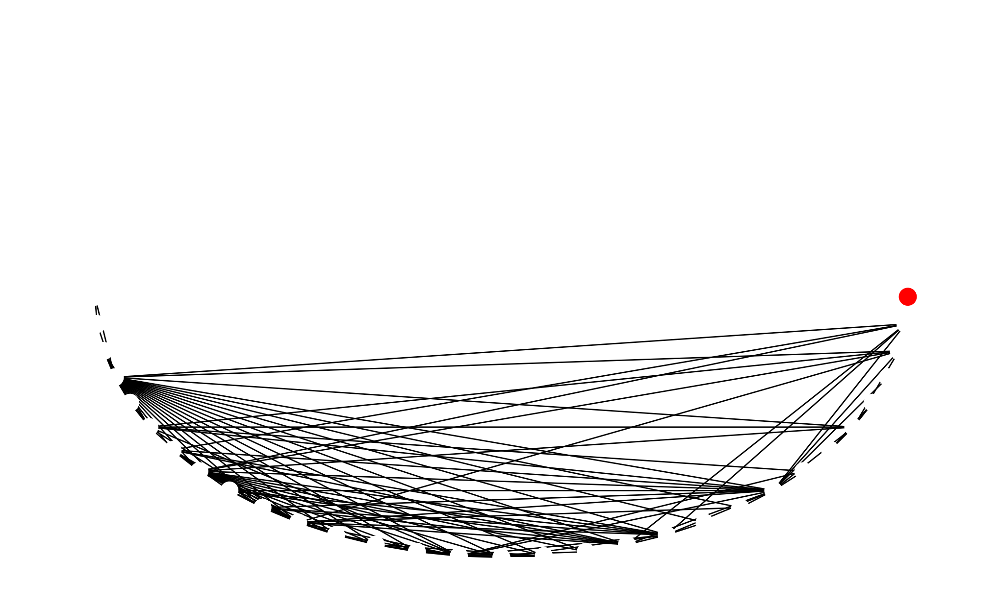

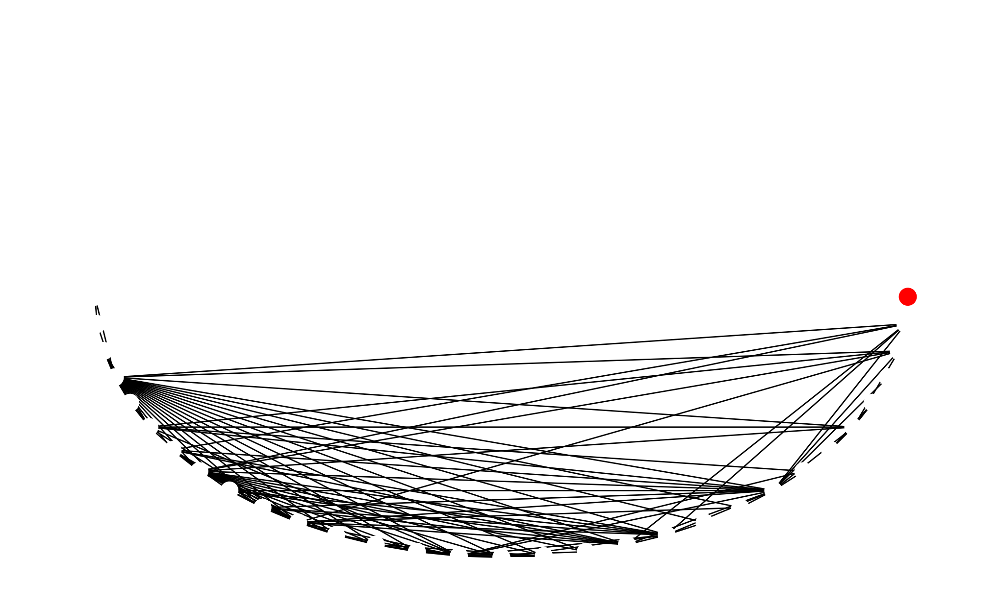

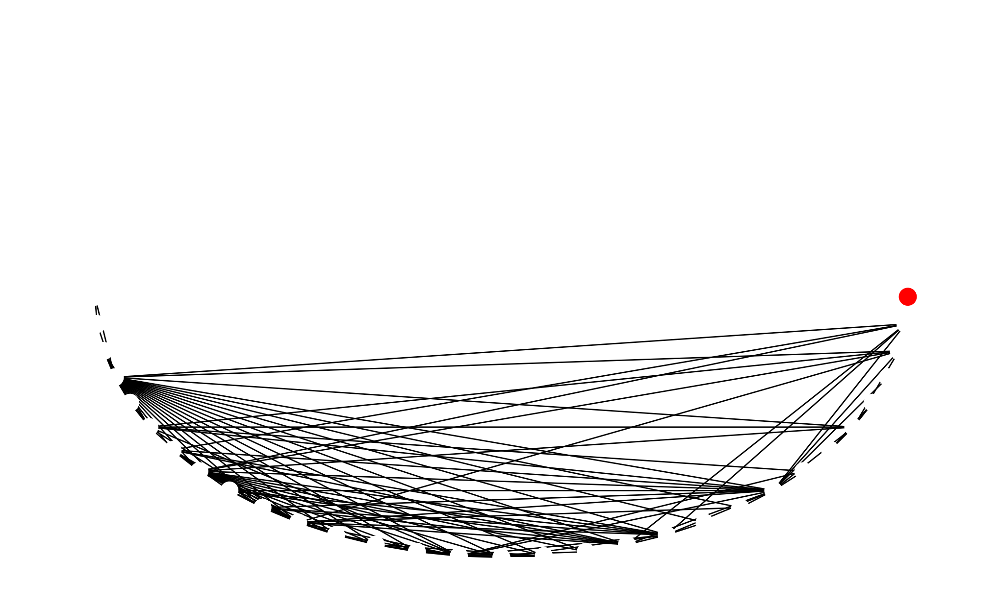

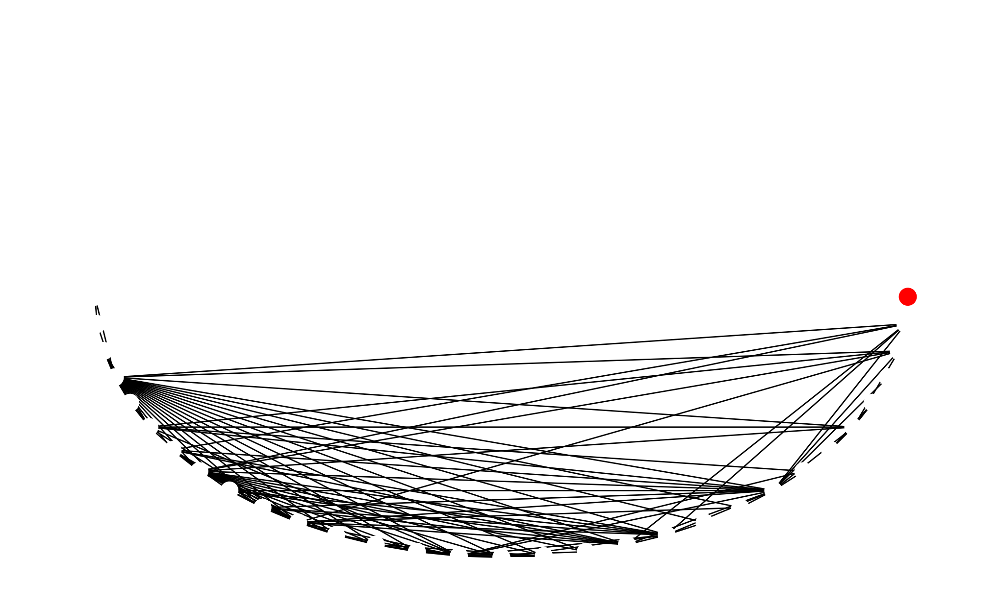

## 3) Initialization of the graph

In [ ]:
sna_avatar = [
    ('AGENT 1', 'AGENT 2'), ('CREW CHIEF', 'JAKE'), ('CREW CHIEF', 'MAN'), ('CREW CHIEF', 'WAINFLEET'),
    ('EYTUKAN', 'GRACE'), ('EYTUKAN', 'GUNNER'), ('EYTUKAN', 'PILOTS'), ('EYTUKAN', 'TRUDY'), ('GRACE', 'GUARD'),
    ('GRACE', 'MAX'), ('GRACE', 'MED TECH'), ('GRACE', 'NORM'), ('GRACE', 'OMIITED'), ('GRACE', 'TECH'),
    ('GRACE', 'THEM'), ('GRACE', 'TRUDY'), ('GRACE', 'WAINFLEET'), ('GUARD', 'JAKE'), ('GUARD', 'MAX'),
    ('GUARD', 'NORM'), ('GUNNER', "MO'AT"), ('GUNNER', 'NEYTIRI'), ('GUNNER', 'PILOTS'), ('GUNNER', 'TRUDY'),
    ('JAKE', 'AGENT 1'), ('JAKE', 'AGENT 2'), ('JAKE', 'EYTUKAN'), ('JAKE', 'GRACE'), ('JAKE', 'GUNNER'),
    ('JAKE', 'HERE'), ('JAKE', 'MAN'), ('JAKE', 'MAX'), ('JAKE', 'MECHANIC'), ('JAKE', 'MED TECH'),
    ('JAKE', "MO'AT"), ('JAKE', 'NORM'), ('JAKE', 'OMIITED'), ('JAKE', 'PILOTS'), ('JAKE', 'QUARITCH'),
    ('JAKE', 'TECH'), ('JAKE', 'THEM'), ('MAX', 'MED TECH'), ('MAX', 'TECH'), ('MAX', 'TRUDY'), ("MO'AT", 'EYTUKAN'),
    ("MO'AT", 'GRACE'), ("MO'AT", 'NEYTIRI'), ("MO'AT", 'PILOTS'), ("MO'AT", 'TRUDY'), ('NEYTIRI', 'EYTUKAN'),
    ('NEYTIRI', 'GRACE'), ('NEYTIRI', 'HERE'), ('NEYTIRI', 'JAKE'), ('NEYTIRI', 'OMIITED'), ('NORM', 'MAX'),
    ('NORM', 'MED TECH'), ('NORM', 'NEYTIRI'), ('NORM', 'OMIITED'), ('NORM', 'TECH'), ('NORM', 'THEM'),
    ('NORM', 'TROOPERS'), ('NORM', 'TRUDY'), ('OPERATOR', 'SELFRIDGE'), ('OPERATOR', 'SUPERVISOR'),
    ('PILOTS', 'NEYTIRI'), ('PILOTS', 'TRUDY'), ('QUARITCH', 'EYTUKAN'), ('QUARITCH', 'GRACE'), ('QUARITCH', 'GUNNER'),
    ('QUARITCH', 'MECHANIC'), ('QUARITCH', "MO'AT"), ('QUARITCH', 'NEYTIRI'), ('QUARITCH', 'NORM'),
    ('QUARITCH', 'PILOT'), ('QUARITCH', 'PILOTS'), ('QUARITCH', 'TROOPER'), ('QUARITCH', 'TROOPERS'),
    ('QUARITCH', 'TRUDY'), ('SELFRIDGE', 'GRACE'), ('SELFRIDGE', 'JAKE'), ('SELFRIDGE', 'QUARITCH'),
    ('SUPERVISOR', 'SELFRIDGE'), ('TECH', 'MED TECH'), ('TROOPER', 'GRACE'), ('TROOPER', 'JAKE'),
    ('TROOPER', 'SELFRIDGE'), ('TRUDY', 'GUARD'), ('TRUDY', 'JAKE'), ('TRUDY', 'MECHANIC'), ('TRUDY', 'NEYTIRI'),
    ('TRUDY', 'TROOPER'), ('TRUDY', 'WAINFLEET'), ("TSU'TEY", 'EYTUKAN'), ("TSU'TEY", 'GRACE'), ("TSU'TEY", 'JAKE'),
    ("TSU'TEY", "MO'AT"), ("TSU'TEY", 'NEYTIRI'), ("TSU'TEY", 'QUARITCH'), ('WAINFLEET', 'JAKE'),
    ('WAINFLEET', 'MAN'), ('WAINFLEET', 'NORM'), ('WAINFLEET', 'QUARITCH'), ('WAINFLEET', 'SELFRIDGE'),
    ('WAINFLEET', 'TROOPER'), ('WAINFLEET', 'TROOPERS'),
]

G_AVATAR = nx.Graph()
G_AVATAR.add_edges_from(sna_avatar)

list_of_names = [
    'AGENT 1', 'AGENT 2', 'CREW CHIEF', 'JAKE', 'MAN', 'WAINFLEET', 'EYTUKAN', 'GRACE', 'GUNNER', 
    'PILOTS', 'TRUDY', 'GUARD', 'MAX', 'MED TECH', 'NORM', 'OMIITED', 'TECH', 'THEM', 'QUARITCH', 
    'MO\'AT', 'NEYTIRI', 'OPERATOR', 'SELFRIDGE', 'SUPERVISOR', 'PILOT', 'TROOPER', 'TROOPERS', 
    'FESTA', 'SULTANA', 'CAY', 'MISUN', 'VENTURI', 'HAMILTON', 'MOROVIC', 'COSTA', 'ROMA'
]

node_name_map = {node: name for node, name in zip(G_AVATAR.nodes(), list_of_names)}

plt.figure(figsize=(12, 12))
nx.draw_circular(G_AVATAr, with_labels=True, labels=node_name_map)
plt.show()

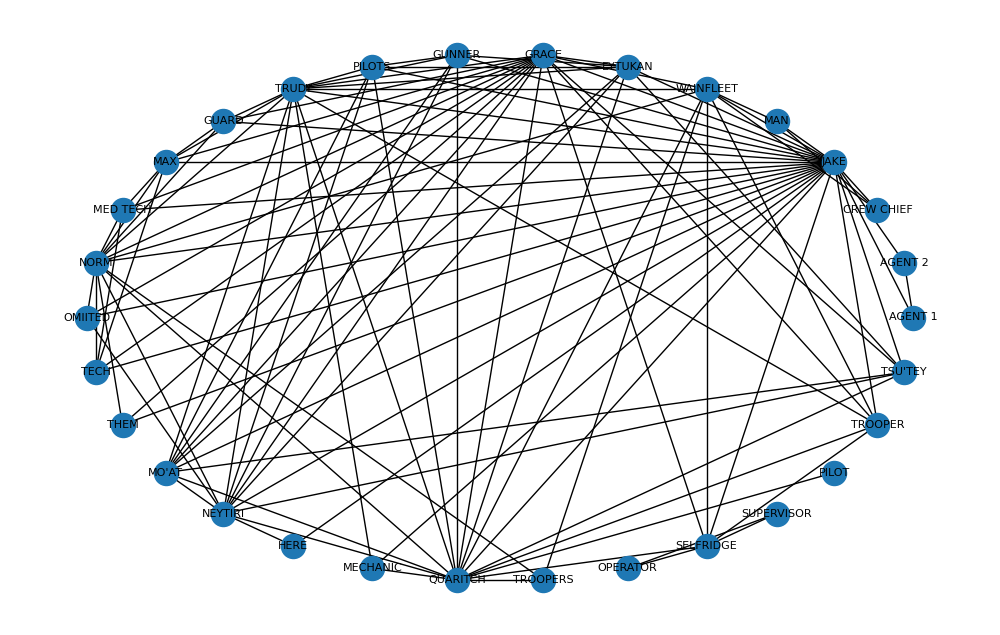

This visualization helps us understand the interconnectedness of characters in the movie. Characters that appear frequently together or have strong relationships are likely more central in the network.
We can identify groups of characters (cliques or sub-networks) that share more interactions with each other, as well as isolated characters or groups with fewer connections.

## 4) Threshold model (Deterministic updating)

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
def simulation_threshold_plot(G_AVATAR, threshold, I, time_limit):
    for node in G_AVATAR.nodes():
        G_AVATAR.nodes[node]['category'] = 'Inactive'
    for node in I:
        G_AVATAR.nodes[node]['category'] = 'Active'

    color_map = {'Inactive': 'w', 'Active': 'r'}
 
    nx.draw_circular(G_AVATAR, node_size=150, with_labels=False,node_color=[color_map[G_AVATAR.nodes[node]['category']] for node in G_AVATAR.nodes()])
    plt.show()
    # Iteration
    t = 1
    while t <= time_limit - 1:
        t = t + 1
        #go over the nodes and check for activation
        for node in G_AVATAR.nodes():
            neighbor_active = 0  # Counter for active neighbors
            for neighbor in G_AVATAR.neighbors(node):
                if G_AVATAR.nodes[neighbor]['category'] == 'Active':
                    neighbor_active=neighbor_active+1
                else:
                    neighbor_active=neighbor_active
        # Check if the threshold is reached. If so active the node
           
            if neighbor_active>=threshold:
                G_AVATAR.nodes[node]['category']='Active'

#we plot only at the end of the iteration
        nx.draw_circular(G_AVATAR, node_size=150, with_labels=False)
                         node_color=[color_map[G_AVATAR.nodes[node]['category']] for node in G_AVATAR.nodes()])
        plt.show()

# Example: Initial outbreak from a set of nodes (e.g., 'JAKE')
initial_nodes = ['JAKE']

simulation_threshold_plot(G_AVATAR, threshold=1, I=initial_nodes, time_limit=4)


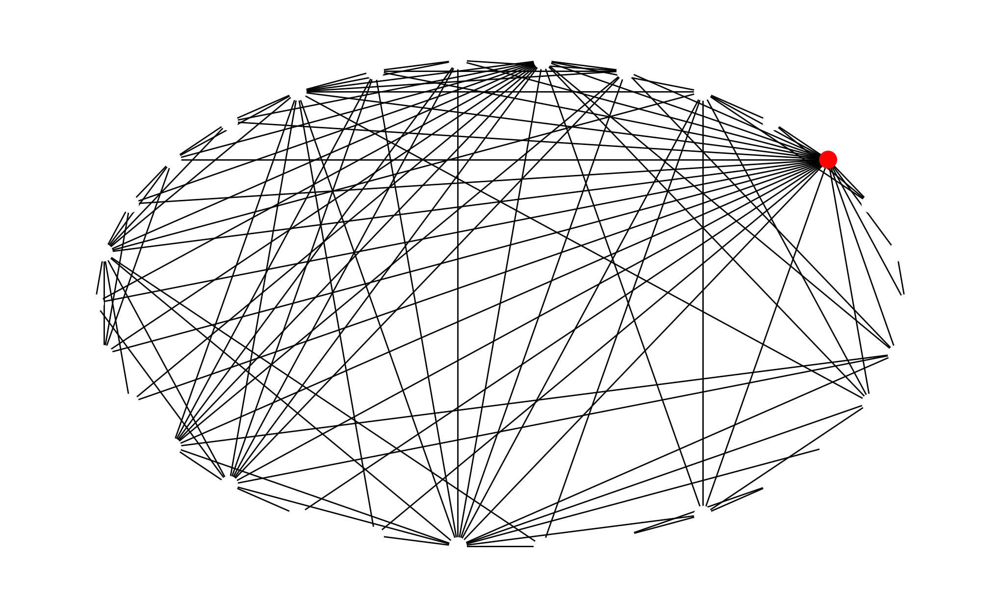

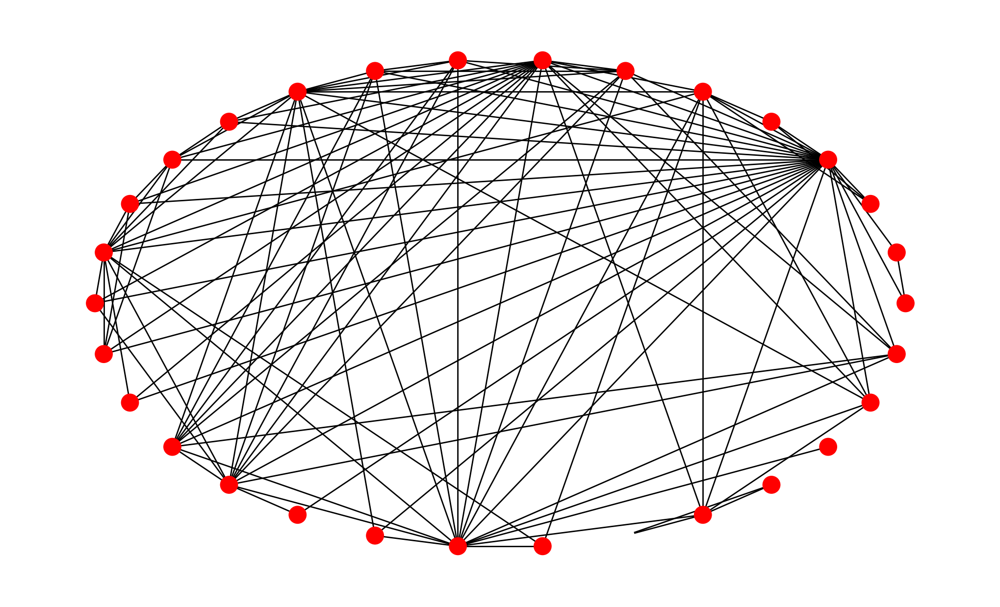

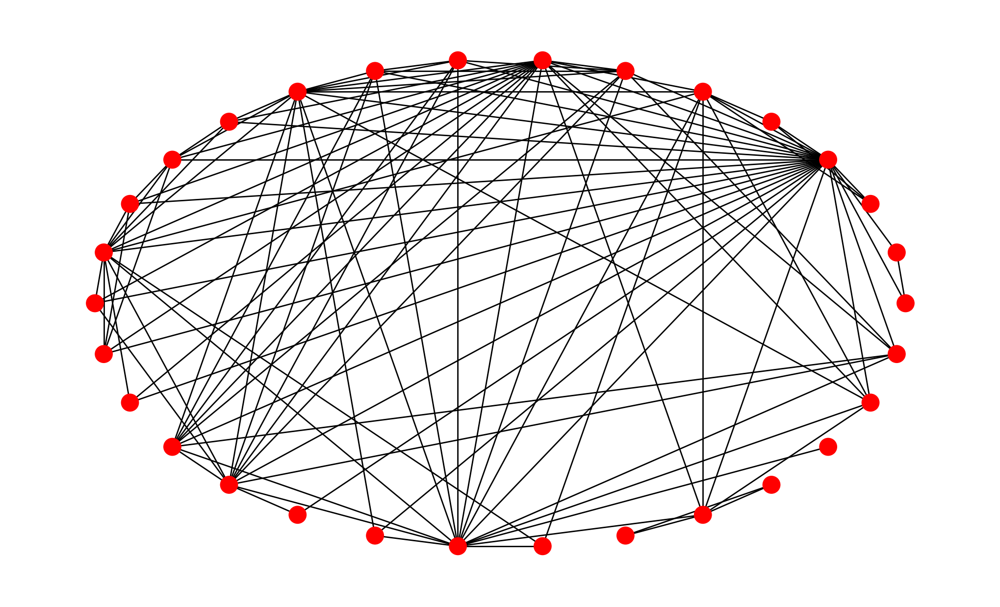

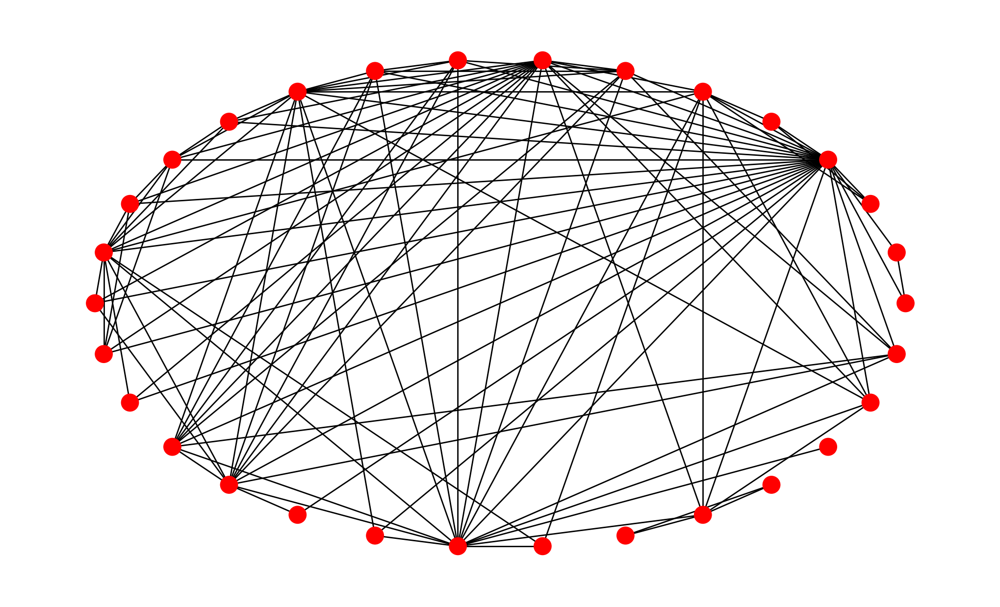

Here are the results for the asynchronous threshold model simulation applied to the Avatar network:

Iteration 1: Initially, 'JAKE' is the only active node (colored red), while all other nodes are inactive (colored white).
Subsequent Iterations: In each iteration, nodes that have enough active neighbors become active. This spread continues based on the threshold condition.
The simulation runs for 4 iterations, showing how the contagion propagates through the network with each step.

# **CONCLUSION**

Through the Independent Cascade model, we simulated several outbreak scenarios in the Avatar network. We found that the starting node and the probability of contagion significantly impact the spread. For example, starting with JAKE or GRACE led to larger outbreaks due to their central positions, while starting with less connected characters resulted in slower and smaller spreads. Changing parameters like the contagion probability also altered how quickly the outbreak grew. These simulations highlighted how central nodes play a critical role in spreading influence, reflecting the dynamics of the movie’s storyline. Overall, this week’s task provided valuable insights into how information or influence propagates in a social network.